# Capstone Project 2: Exploratory Data Analysis

## Table of Contents
* [1 Import Packages](#1-Import-Packages)
* [2 Load Data](#2-Load-Data)
* [3 Cleaning](#3-Cleaning)
    * [3.1 Altering Cells with Value 5.3976e-79](#3.1-Altering-Cells-with-Value-5.3976e-79)
    * [3.2 Changing Appropriate dtypes to "datetime" and "category"](#3.2-Changing-Appropriate-dtypes-to-"datetime"-and-"category")
    * [3.3 Removing Redundant Columns](#3.3-Removing-Redundant-Columns)
    * [3.4 Removing Categorical Entries in Non-Categorical Data](#3.4-Removing-Categorical-Entries-in-Non-Categorical-Data)
    * [3.5 Altering Non-Categorical Columns that Use More than One Measuring Unit](#3.5-Altering-Non-Categorical-Columns-that-Use-More-than-One-Measuring-Unit)
    * [3.6 Missing Values](#3.6-Missing-Values)
        * [3.6.1 Bar and Matrix Plots for Categorical Features with the Missingno Package](#3.6.1-Bar-and-Matrix-Plots-for-Categorical-Features-with-the-Missingno-Package)
        * [3.6.2 Adding Category for Missing values in Categorical Features](#3.6.2-Adding-Category-for-Missing-Values-in-Categorical-Features)
        * [3.6.3 Imputing Missing Values in Non-Categorical Columns](#3.6.3-Imputing-Missing-Values-in-Non-Categorical-Columns)
    * [3.7 Final, Cleaned Dataframe](#3.7-Final,-Cleaned-Dataframe)
* [4 Plotting](#4-Plotting)
    * [4.1 Splitting Categorical and Non-Categorical Data](#4.1-Splitting-Categorical-and-Non-Categorical-Data)
    * [4.2 Count Plots of Categorical Features](#4.2-Count-Plots-of-Categorical-Features)
    * [4.3 Distrubution Plots of Non-Categorical Features](#4.3-Distrubution-Plots-of-Non-Categorical-Features)
    * [4.4 Heatmap for Categorical Features](#4.4-Heatmap-for-Categorical-Features)
    * [4.5 Scatter Plots and Heatmap for Categorical Features](#4.5-Scatter-Plots-and-Heatmap-for-Categorical-Features)
    * [4.6 Categorical Plots Based on Demographics](#4.6-Categorical-Plots-Based-on-Demographics)
        * [4.6.1 Normalized Countplots of Categorical Features by Demographics](#4.6.1-Normalized-Countplots-of-Categorical-Features-by-Demographics)
        * [4.6.2 Boxplot for Non-Categorical Features by Demographics](#4.6.2-Boxplot-for-Non-Categorical-Features-by-Demographics)
* [5 Final Remarks](#5-Final-Remarks)

# 1 Import Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

# 2 Load Data

In [2]:
path_in ='../Data/2015_clean.zip'
df_gen = pd.read_csv(path_in, compression='zip', chunksize=100000)
df = pd.DataFrame()
for d in df_gen:
    df = pd.concat([df, d])
    
df.head()

,_STATE,FMONTH,IDATE,IMONTH,IDAY,IYEAR,DISPCODE,SEQNO,_PSU,CTELENUM,...,_PAREC1,_PASTAE1,_LMTACT1,_LMTWRK1,_LMTSCL1,_RFSEAT2,_RFSEAT3,_FLSHOT6,_PNEUMO2,_AIDTST3
0,1.0,1.0,2015-01-29,1.0,29.0,2015.0,1200.0,2.015000e+09,2.015000e+09,1.0,...,4.0,2.0,1.0,1.0,1.0,1.0,1.0,NaN,NaN,1.0
1,1.0,1.0,2015-01-20,1.0,20.0,2015.0,1100.0,2.015000e+09,2.015000e+09,1.0,...,2.0,2.0,3.0,3.0,4.0,2.0,2.0,NaN,NaN,2.0
2,1.0,1.0,2015-02-01,2.0,1.0,2015.0,1200.0,2.015000e+09,2.015000e+09,1.0,...,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,NaN
3,1.0,1.0,2015-01-14,1.0,14.0,2015.0,1100.0,2.015000e+09,2.015000e+09,1.0,...,4.0,2.0,1.0,1.0,1.0,1.0,1.0,NaN,NaN,9.0
4,1.0,1.0,2015-01-14,1.0,14.0,2015.0,1100.0,2.015000e+09,2.015000e+09,1.0,...,4.0,2.0,1.0,1.0,1.0,1.0,1.0,NaN,NaN,1.0


# 3 Cleaning

## 3.1 Altering Cells with Value 5.3976e-79

For unknown reasons, some of the cells in the dataframe have values of 5.3976e-79. This can be seen, for example, when you look at the value counts of the `ACTIN11_` column, 

In [3]:
df['ACTIN11_'].value_counts(dropna=False).sort_index()

5.397605e-79     14662
1.000000e+00    180152
2.000000e+00     96620
NaN             150022
Name: ACTIN11_, dtype: int64

I suspect that these values were meant to be 0.0. To verify this, I checked the proportion of values in the column `ACTIN11_` that have this value,

In [4]:
col = 'ACTIN11_'
s = df.loc[~np.isnan(df[col]), col] #Filter out nan values from the series
s1 = s[(s > 0) & (s < 1)]
len(s1) / len(s)

0.05030984716951351

According to the codebook, the proportion of entries in this column with a value of 0.0 should be 0.05. This confirms that these values are meant to be 0.0.

**Getting list of columns that contain values between 0.0 and 1.0**

In [5]:
cols_0_to_1 = []
for c in df.columns:
    if df[c].dtype != 'object':
        s = df[c]
        s = s[(s > 0) & (s < 1)]
        v = s.shape[0]
        if v > 0:
            cols_0_to_1.append(c)

cols_0_to_1

['NUMMEN',
 'NUMWOMEN',
 'JOINPAIN',
 '_STRWT',
 '_RAWRAKE',
 '_WT2RAKE',
 '_DUALCOR',
 'DROCDY3_',
 '_DRNKWEK',
 'FTJUDA1_',
 'FRUTDA1_',
 'BEANDAY_',
 'GRENDAY_',
 'ORNGDAY_',
 'VEGEDA1_',
 '_MISFRTN',
 '_MISVEGN',
 '_FRTRESP',
 '_VEGRESP',
 '_FRUTSUM',
 '_VEGESUM',
 '_FRT16',
 '_VEG23',
 '_FRUITEX',
 '_VEGETEX',
 'METVL11_',
 'METVL21_',
 'ACTIN11_',
 'ACTIN21_',
 '_MINAC11',
 '_MINAC21',
 'STRFREQ_',
 'PAMISS1_',
 'PAMIN11_',
 'PAMIN21_',
 'PA1MIN_',
 'PAVIG11_',
 'PAVIG21_',
 'PA1VIGM_']

**For each of these columns, getting the unique values between 0.0 and 1.0**

In [6]:
for c in cols_0_to_1:
    s = df[c]
    u = np.sort(s.unique())
    u = [x for x in u if ((x > 0) and (x < 1))]
    print(f'{c}:', u[:4]) #It is only necessary to show the first 4 values since the values are sorted.

NUMMEN: [5.397605346934028e-79]
NUMWOMEN: [5.397605346934028e-79]
JOINPAIN: [5.397605346934028e-79]
_STRWT: [0.9452460365669324]
_RAWRAKE: [0.3333333333333333, 0.5, 0.6666666666666666]
_WT2RAKE: [0.3627727202146234, 0.4899203944210535, 0.5441590803219352, 0.6072934242624906]
_DUALCOR: [0.0794375210079174, 0.0855040225599762, 0.1169015707809, 0.1292511639700471]
DROCDY3_: [5.397605346934028e-79]
_DRNKWEK: [5.397605346934028e-79]
FTJUDA1_: [5.397605346934028e-79]
FRUTDA1_: [5.397605346934028e-79]
BEANDAY_: [5.397605346934028e-79]
GRENDAY_: [5.397605346934028e-79]
ORNGDAY_: [5.397605346934028e-79]
VEGEDA1_: [5.397605346934028e-79]
_MISFRTN: [5.397605346934028e-79]
_MISVEGN: [5.397605346934028e-79]
_FRTRESP: [5.397605346934028e-79]
_VEGRESP: [5.397605346934028e-79]
_FRUTSUM: [5.397605346934028e-79]
_VEGESUM: [5.397605346934028e-79]
_FRT16: [5.397605346934028e-79]
_VEG23: [5.397605346934028e-79]
_FRUITEX: [5.397605346934028e-79]
_VEGETEX: [5.397605346934028e-79]
METVL11_: [5.397605346934028

We see from the above results that four columns have values between 0 and 1 other than 5.3976e-79. These four columns correspond to sample weights variables, so these kinds of values are to be expected.

I will, therefore, update the list of columns to exclude these ones.

In [7]:
cols_0_to_1 = [c for c in cols_0_to_1 if c not in cols_0_to_1[3:7]]
cols_0_to_1

['NUMMEN',
 'NUMWOMEN',
 'JOINPAIN',
 'DROCDY3_',
 '_DRNKWEK',
 'FTJUDA1_',
 'FRUTDA1_',
 'BEANDAY_',
 'GRENDAY_',
 'ORNGDAY_',
 'VEGEDA1_',
 '_MISFRTN',
 '_MISVEGN',
 '_FRTRESP',
 '_VEGRESP',
 '_FRUTSUM',
 '_VEGESUM',
 '_FRT16',
 '_VEG23',
 '_FRUITEX',
 '_VEGETEX',
 'METVL11_',
 'METVL21_',
 'ACTIN11_',
 'ACTIN21_',
 '_MINAC11',
 '_MINAC21',
 'STRFREQ_',
 'PAMISS1_',
 'PAMIN11_',
 'PAMIN21_',
 'PA1MIN_',
 'PAVIG11_',
 'PAVIG21_',
 'PA1VIGM_']

**Changing all values of 5.3976e-79 in these columns with 0.0**

In [8]:
for c in cols_0_to_1:
    df[c] = df[c].apply(lambda x: 0.0 if (x > 0) and (x < 1) else x)

In [9]:
for c in cols_0_to_1:
    #Printing the first 4 sorted unique values to confirm there are no values of
    #5.3976e-79
    print(c, '\n', np.sort(df[c].unique())[:4], '\n')

NUMMEN 
 [0. 1. 2. 3.] 

NUMWOMEN 
 [0. 1. 2. 3.] 

JOINPAIN 
 [0. 1. 2. 3.] 

DROCDY3_ 
 [ 0.  3.  7. 10.] 

_DRNKWEK 
 [ 0. 23. 47. 70.] 

FTJUDA1_ 
 [0. 2. 3. 7.] 

FRUTDA1_ 
 [0. 2. 3. 7.] 

BEANDAY_ 
 [0. 2. 3. 7.] 

GRENDAY_ 
 [0. 2. 3. 7.] 

ORNGDAY_ 
 [0. 2. 3. 7.] 

VEGEDA1_ 
 [0. 2. 3. 7.] 

_MISFRTN 
 [0. 1. 2.] 

_MISVEGN 
 [0. 1. 2. 3.] 

_FRTRESP 
 [0. 1.] 

_VEGRESP 
 [0. 1.] 

_FRUTSUM 
 [0. 2. 3. 4.] 

_VEGESUM 
 [0. 2. 3. 4.] 

_FRT16 
 [0. 1.] 

_VEG23 
 [0. 1.] 

_FRUITEX 
 [0. 1. 2.] 

_VEGETEX 
 [0. 1. 2.] 

METVL11_ 
 [ 0. 25. 30. 33.] 

METVL21_ 
 [ 0. 25. 30. 33.] 

ACTIN11_ 
 [ 0.  1.  2. nan] 

ACTIN21_ 
 [ 0.  1.  2. nan] 

_MINAC11 
 [0. 2. 3. 4.] 

_MINAC21 
 [0. 2. 3. 4.] 

STRFREQ_ 
 [  0. 233. 467. 700.] 

PAMISS1_ 
 [0. 1. 9.] 

PAMIN11_ 
 [0. 2. 3. 4.] 

PAMIN21_ 
 [0. 2. 3. 4.] 

PA1MIN_ 
 [0. 2. 3. 4.] 

PAVIG11_ 
 [0. 2. 3. 5.] 

PAVIG21_ 
 [0. 2. 3. 5.] 

PA1VIGM_ 
 [0. 2. 3. 5.] 



## 3.2 Changing Appropriate dtypes to "datetime" and "category"

**Defining function that adds the 'category' dtype to the categorical features**

In [10]:
def add_category_dtype(dataframe):
    '''This function takes a dataframe as input and changes the dtype of all categorical features to 
        "category" '''
    dataframe['IDATE'] = pd.to_datetime(dataframe['IDATE'])

    #List of column names with "float" dtype
    cols_float = dataframe.select_dtypes(include='float').columns

    #List of column names that are non-categorical
    cols_non_cat = ['NUMADULT', 'NUMMEN', 'NUMWOMEN', 'HHADULT', 'PHYSHLTH', 'MENTHLTH', 'POORHLTH',\
                    'DIABAGE2', 'CHILDREN', 'WEIGHT2', 'HEIGHT3', 'ALCDAY5', 'AVEDRNK2',\
                    'DRNK3GE5', 'MAXDRNKS', 'FRUITJU1', 'FRUIT1', 'FVBEANS', 'FVGREEN', 'FVORANG',\
                    'VEGETAB1', 'EXEROFT1', 'EXERHMM1', 'EXEROFT2', 'EXERHMM2', 'STRENGTH', 'BLDSUGAR',\
                    'FEETCHK2', 'DOCTDIAB', 'CHKHEMO3', 'FEETCHK', 'LONGWTCH', 'ASTHMAGE', 'ASERVIST',\
                    'ASDRVIST', 'ASRCHKUP', 'ASACTLIM', 'SCNTWRK1', 'SCNTLWK1', 'ADPLEASR', 'ADDOWN',\
                    'ADSLEEP', 'ADENERGY', 'ADEAT1', 'ADFAIL', 'ADTHINK', 'ADMOVE', '_STSTR', '_STRWT',\
                    '_RAWRAKE', '_WT2RAKE', '_CLLCPWT', '_DUALCOR', '_LLCPWT', '_AGE80', 'HTIN4', 'HTM4',\
                    'WTKG3', '_BMI5', 'DROCDY3_', '_DRNKWEK', 'FTJUDA1_', 'FRUTDA1_', 'BEANDAY_',\
                    'GRENDAY_', 'ORNGDAY_', 'VEGEDA1_', '_MISFRTN', '_MISVEGN', '_FRUTSUM', '_VEGESUM',\
                    'METVL11_', 'METVL21_', 'MAXVO2_', 'FC60_', 'PADUR1_', 'PADUR2_', 'PAFREQ1_', 'PAFREQ2_',\
                    '_MINAC11', '_MINAC21', 'STRFREQ_', 'PAMIN11_', 'PAMIN21_', 'PA1MIN_', 'PAVIG11_',\
                    'PAVIG21_', 'PA1VIGM_']

    #List of column names that will be converted to "category" dtype. In other words, all float columns 
    #of the DataFrame not in in the list cols_non_cat.
    cols_to_cat = [c for c in cols_float if c not in cols_non_cat]

    #This checks that no typos were made when defining "cols_non_cat"

    #Changing dtypes of appropriate columns to 'category'
    dataframe.loc[:, cols_to_cat] = dataframe.loc[:, cols_to_cat].astype('category')

**Applying the function defined in the previous cell and checking that the dtypes were indeed changed**

In [11]:
add_category_dtype(df)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 441456 entries, 0 to 441455
Columns: 326 entries, _STATE to _AIDTST3
dtypes: category(235), datetime64[ns](1), float64(88), object(2)
memory usage: 408.1+ MB


## 3.3 Removing Redundant Columns

Some of the columns are found to be redundant. For example, the `HEIGHT3` column contains the height of the survey participants in both units of inches and meters, but the column `HTM4` contains all of the heights converted to units of meters.

Those columns found to be redundant will be dropped.

In [12]:
cols_rem = ['WEIGHT2', 'HEIGHT3', 'FRUITJU1', 'FRUIT1', 'FVBEANS', 'FVGREEN', 'FVORANG', 'VEGETAB1', \
           'EXEROFT1', 'EXERHMM1', 'EXEROFT2', 'EXERHMM2', 'STRENGTH']

df = df.drop(cols_rem, axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 441456 entries, 0 to 441455
Columns: 313 entries, _STATE to _AIDTST3
dtypes: category(235), datetime64[ns](1), float64(75), object(2)
memory usage: 364.3+ MB


## 3.4 Removing Categorical Entries in Non-Categorical Data
Some of the non-categorical columns have entries representing categories. For example, in the column `PHYSHLTH`, entries between 1-30 don't represent categories, but entries 88, 77, and 99 represent, respectively, answers of "None", "Don't know/Not sure", and "Refused". The entry of 88 naturally corresponds to a non-categorical value of 0, while the other two of these entries should be changed to NaN so as to avoid problems when plotting the distribution of the values in this column.

In what follows, different columns are placed into different groups depending on which of their values should be set to null and which ones should be set to NaN.

In [13]:
cols_1 = ['HHADULT']
vals_1_to_null = [77.0, 99.0] #Values to change to null.
vals_1_to_0 = [] #Values to change to 0.0
tup_1 = (cols_1, vals_1_to_null, vals_1_to_0) #These tuples will be used in a function later on. 

cols_2 = ['PHYSHLTH', 'MENTHLTH', 'POORHLTH', 'DRNK3GE5', 'DOCTDIAB', 'FEETCHK', 'ADPLEASR', 'ADDOWN', \
          'ADSLEEP', 'ADENERGY', 'ADEAT1', 'ADFAIL', 'ADTHINK', 'ADMOVE']
vals_2_to_null = [77.0, 99.0]
vals_2_to_0 = [88.0]
tup_2 = (cols_2, vals_2_to_null, vals_2_to_0)

cols_3 = ['DIABAGE2']
vals_3_to_null = [98.0, 99.0]
vals_3_to_0 = []
tup_3 = (cols_3, vals_3_to_null, vals_3_to_0)

cols_4 = ['CHILDREN']
vals_4_to_null = [88.0, 99.0]
vals_4_to_0 = []
tup_4 = (cols_4, vals_4_to_null, vals_4_to_0)

cols_5 = ['ALCDAY5', 'BLDSUGAR', 'ASACTLIM']
vals_5_to_null = [777.0, 999.0]
vals_5_to_0 = [888.0]
tup_5 = (cols_5, vals_5_to_null, vals_5_to_0)

cols_6 = ['AVEDRNK2', 'MAXDRNKS']
vals_6_to_null = [77.0, 99.0]
vals_6_to_0 = []
tup_6 = (cols_6, vals_6_to_null, vals_6_to_0)

cols_7 = ['CHKHEMO3']
vals_7_to_null = [77.0, 98.0, 99.0]
vals_7_to_0 = [88.0]
tup_7 = (cols_7, vals_7_to_null, vals_7_to_0)

cols_8 = ['LONGWTCH']
vals_8_to_null = [555.0, 777.0, 999.0]
vals_8_to_0 = []
tup_8 = (cols_8, vals_8_to_null, vals_8_to_0)

cols_9 = ['ASTHMAGE']
vals_9_to_null = [98.0, 99.0]
vals_9_to_0 = [97.0]
tup_9 = (cols_9, vals_9_to_null, vals_9_to_0)

cols_10 = ['ASERVIST', 'ASDRVIST']
vals_10_to_null = [98.0]
vals_10_to_0 = [88.0]
tup_10 = (cols_10, vals_10_to_null, vals_10_to_0)

cols_11 = ['ASRCHKUP']
vals_11_to_null = [98.0, 99.0]
vals_11_to_0 = [88.0]
tup_11 = (cols_11, vals_11_to_null, vals_11_to_0)

cols_12 = ['SCNTWRK1', 'SCNTLWK1']
vals_12_to_null = [97.0, 99.0]
vals_12_to_0 = [98.0]
tup_12 = (cols_12, vals_12_to_null, vals_12_to_0)

cols_13 = ['WTKG3']
vals_13_to_null = [99999.0]
vals_13_to_0 = []
tup_13 = (cols_13, vals_13_to_null, vals_13_to_0)

cols_14 = ['DROCDY3_']
vals_14_to_null = [900.0]
vals_14_to_0 = []
tup_14 = (cols_14, vals_14_to_null, vals_14_to_0)

cols_15 = ['_DRNKWEK', 'MAXVO2_', 'FC60_']
vals_15_to_null = [99900.0]
vals_15_to_0 = []
tup_15 = (cols_15, vals_15_to_null, vals_15_to_0)

cols_16 = ['PAFREQ1_', 'PAFREQ2_', 'STRFREQ_']
vals_16_to_null = [99000.0]
vals_16_to_0 = []
tup_16 = (cols_16, vals_16_to_null, vals_16_to_0)

cols_17 = ['FEETCHK2']
vals_17_to_null = [555.0, 777.0, 999.0]
vals_17_to_0 = [888.0]
tup_17 = (cols_17, vals_17_to_null, vals_17_to_0)

#List of all columns that require alteration.
cols_to_alt = cols_1 + cols_2 + cols_3 + cols_4 + cols_5 + cols_6 + cols_7 + cols_8 + cols_9 + \
    cols_10 + cols_11 + cols_12 + cols_13 + cols_14 + cols_15 + cols_16 + cols_17

tup_list = [tup_1, tup_2, tup_3, tup_4, tup_5, tup_6, tup_7, tup_8, tup_9, tup_10, tup_11, tup_12, \
           tup_13, tup_14, tup_15, tup_16, tup_17]

**Defining function for altering the columns for the previous cell**

In [14]:
def alter_columns(dataframe, columns, values_to_null, values_to_0=[]):
    '''Function that takes as input a dataframe, a list of columns to alter, a list of values 
       in each of the columns that should be changed to null, and a list of the values of each 
       column that should be changed to 0.0. A new column is created witht the altered values
       and placed right next to the previous one with its same name but witht the added string
       '_ALT'.'''
    for c in columns:
        l = dataframe.columns.get_loc(c)
        s = dataframe[c].apply(lambda x: np.nan if x in values_to_null else x)
        if len(values_to_0) != 0:
            s = s.apply(lambda x: 0 if x in values_to_0 else x)
        dataframe.insert(l + 1, c + '_ALT', s)

**Applying the function defined in the previous cell to the features that need altering**

In [15]:
for cols, vals_to_null, vals_to_0 in tup_list:
    alter_columns(df, cols, vals_to_null, vals_to_0)

## 3.5 Altering Non-Categorical Columns that Use More than One Measuring Unit
The following columns contain entries with more than one measuring unit. For example, `BLDSUGAR_ALT` contains entries in units of days, weeks, months, and years. The following cell converts all entries to the same measuring units.

In [16]:
df['ALCDAY5_ALT'] = df['ALCDAY5_ALT'].apply(lambda x: (x - 200.0) // 4 if (x >= 201.0 and x <= 299.0) \
                              else (x - 100.0) if (x >= 101.0 and x <= 199.0) \
                              else x)

for c in ['BLDSUGAR_ALT', 'FEETCHK2_ALT']:
    df[c] = df[c].apply(lambda x: (x - 100.0) if (x >=101.0 and x <= 199.0) \
                              else (x - 200.0) // 7.0 if (x >= 201.0 and x <= 299.0) \
                              else (x - 300.0) // 30.0 if (x >= 301.0 and x <= 399.0) \
                              else (x - 400.0) // 365.0 if (x >= 401.0 and x <= 499.0) \
                              else x)
    
df['LONGWTCH_ALT'] = df['LONGWTCH_ALT'].apply(lambda x: (x - 100.0) if (x >=101.0 and x <= 199.0) \
                              else (x - 200.0) * 7.0 if (x >= 201.0 and x <= 299.0) \
                              else (x - 300.0) * 30.0 if (x >= 301.0 and x <= 399.0) \
                              else (x - 400.0) * 365.0 if (x >= 401.0 and x <= 499.0) \
                              else x)

## 3.6 Missing Values

### 3.6.1 Bar and Matrix Plots for Categorical Features with the Missingno Package

**Function that divides columns in a dataframe into groups and makes either a bar or matrix plot for each of them from the missingno package**

In [17]:
def plot_missing(dataframe, kind):
    '''Function that divides all columns into groups of size "chunk_size" and makes either a bar or
       matrix plot from the missingno package for each of them'''
    chunk_size = 10
    n_cols = dataframe.shape[1]
    n_plots = n_cols // 10
    rem = n_cols - chunk_size * n_plots
    if rem == 0:
        n_fig_rows = n_plots
    else:
        n_fig_rows = n_plots + 1

    h_subplot = 10
    fig_h = h_subplot * n_plots
    fig_w = 10
    fig = plt.figure(figsize=(fig_w, fig_h))
    fig.subplots_adjust(hspace=0.5)

    if kind == 'bar':
        func = msno.bar
    elif kind == 'matrix':
        func = msno.matrix
    else:
        print(f'{kind} is not a valid function argument.')
        
    for i in range(1, n_fig_rows):
        #func(dataframe.iloc[:, (i - 1) * 10:i * 10], ax=fig.add_subplot(n_fig_rows, 1, i))
        func(dataframe.iloc[:, (i - 1) * 10:i * 10])
        plt.show()
        print('\n')
    #func(dataframe.iloc[:, (n_fig_rows -1) * 10:], ax=fig.add_subplot(n_fig_rows, 1, n_fig_rows))
    func(dataframe.iloc[:, (n_fig_rows -1) * 10:])
    plt.show()

**Applying the function defined on the previous cell to get bar plots and matrix plots**

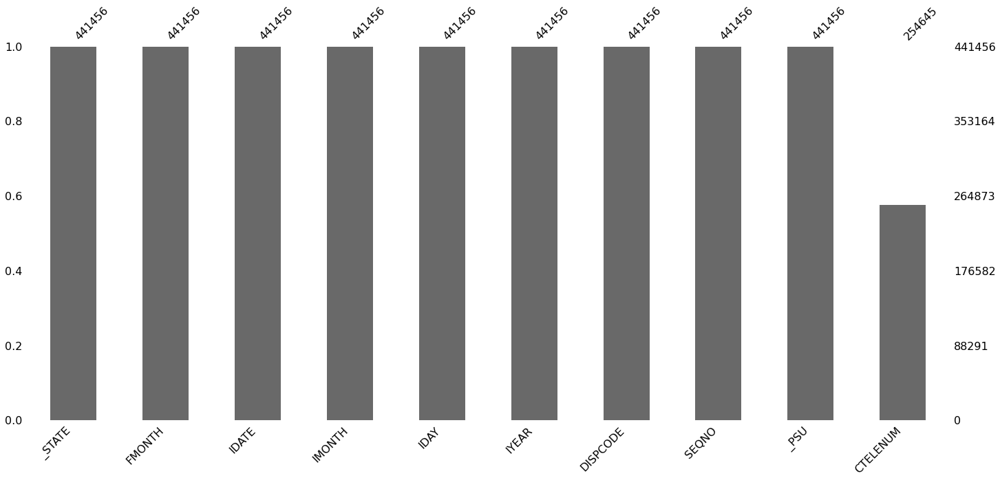

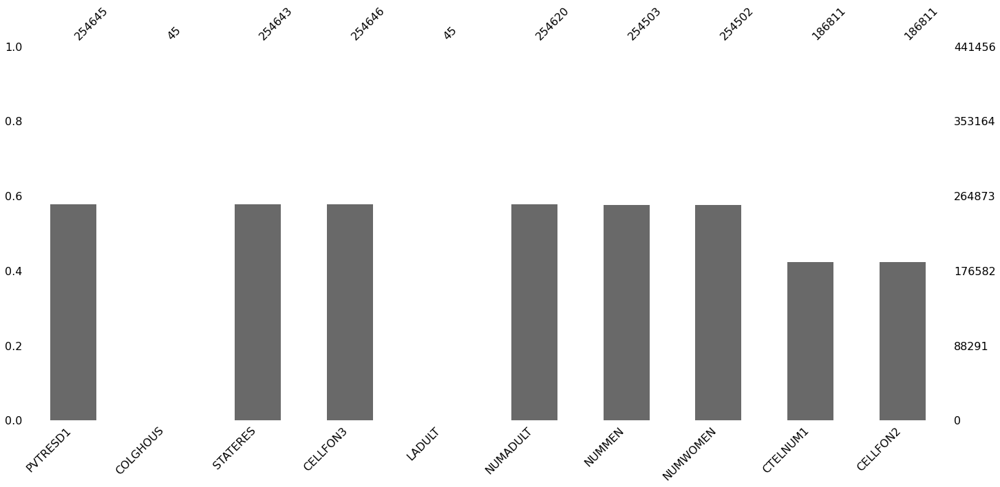

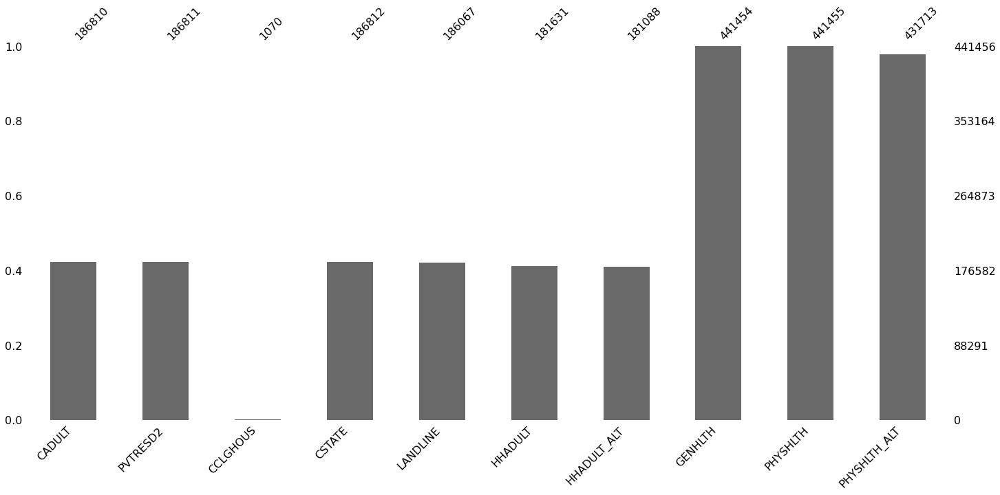

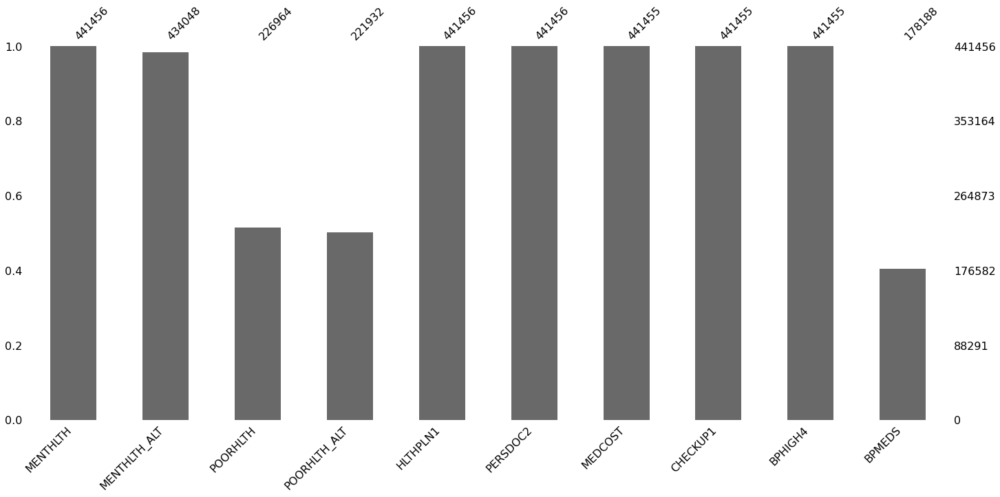

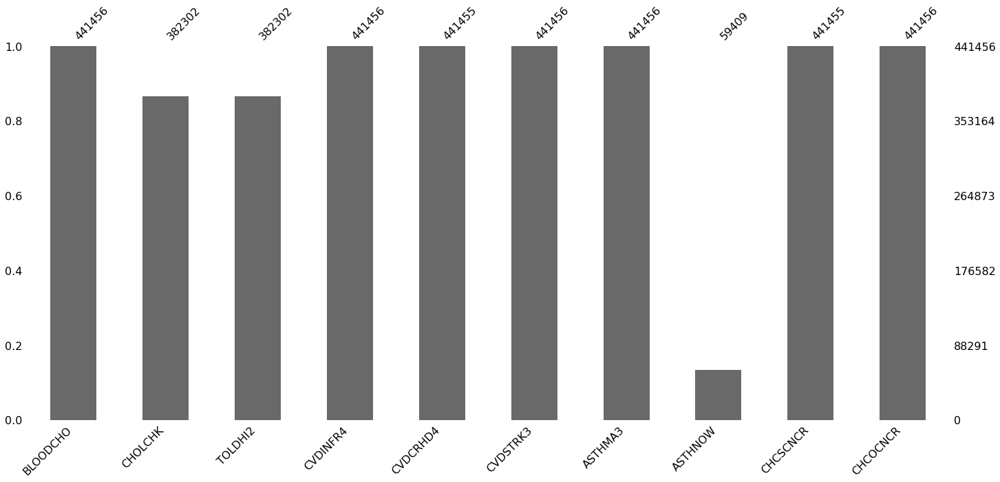

...

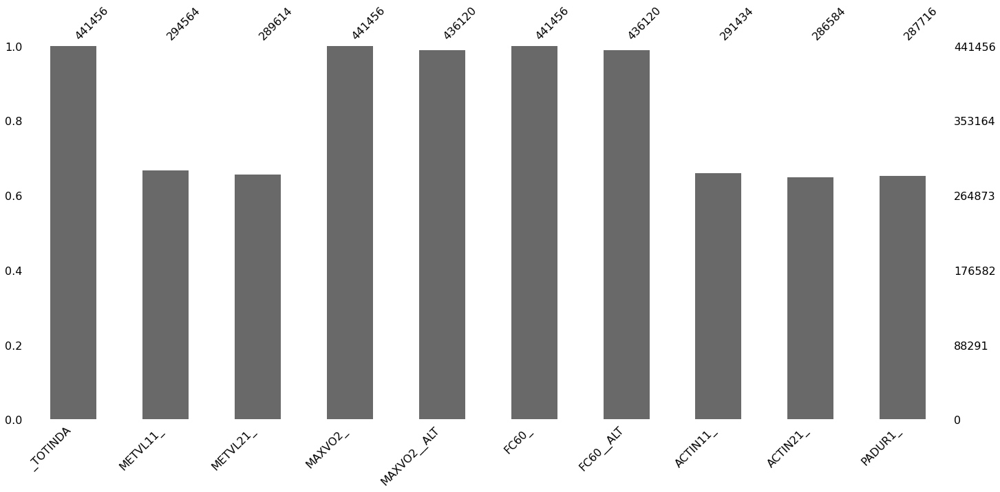

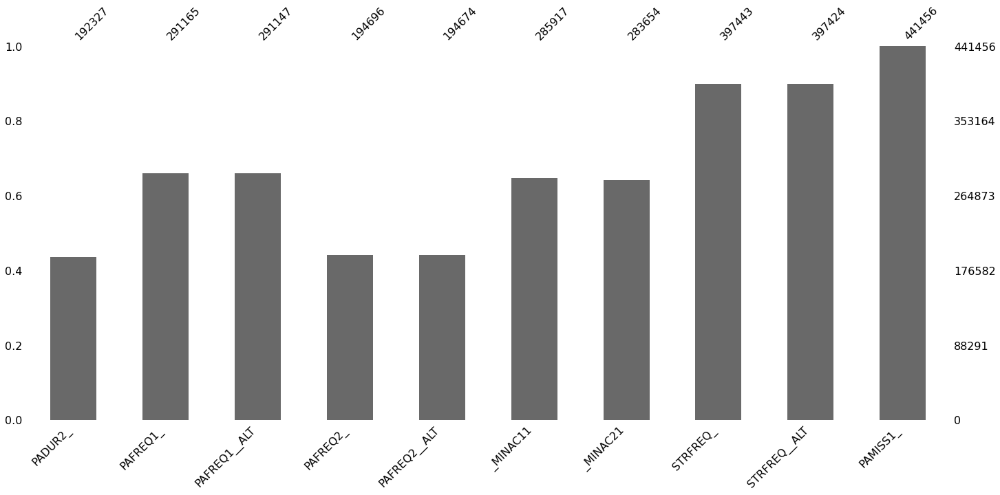

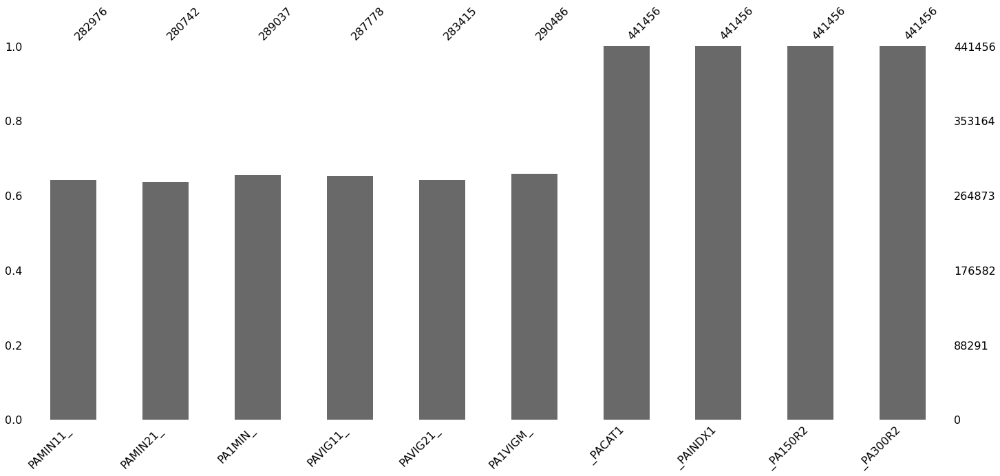

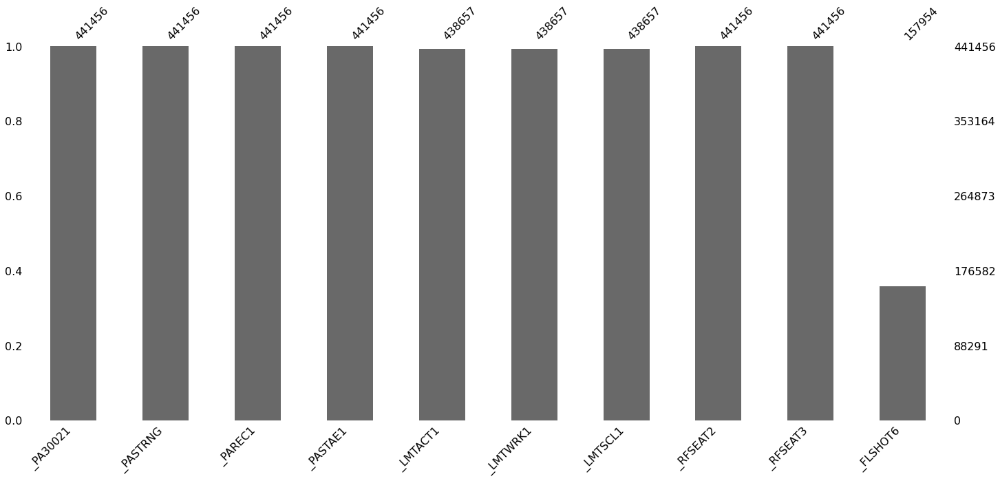

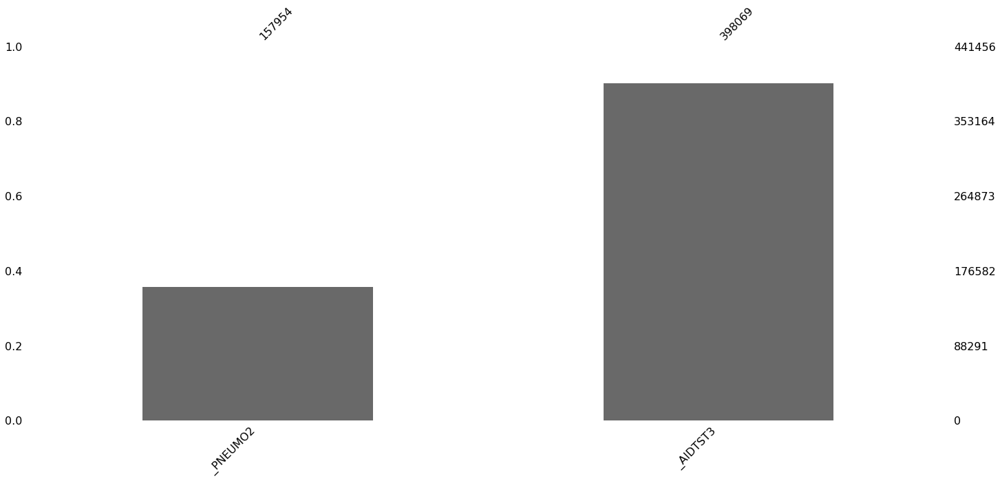

In [18]:
plot_missing(df, 'bar')

<Figure size 720x25200 with 0 Axes>

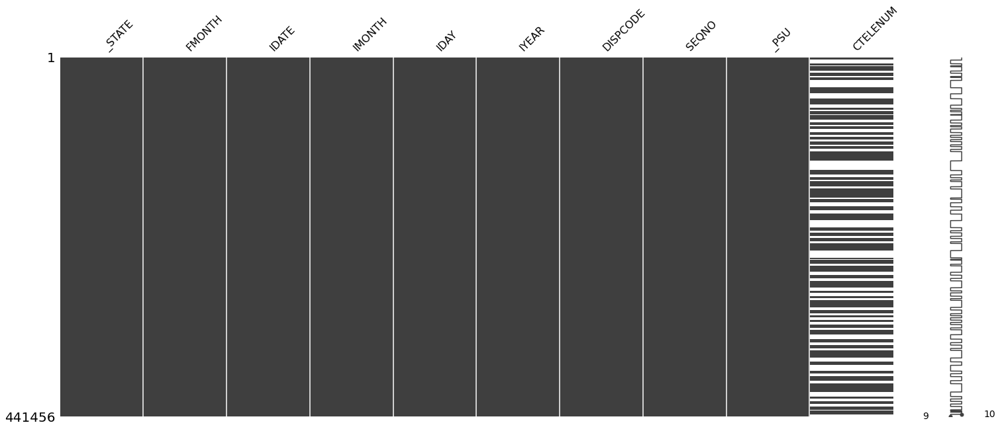

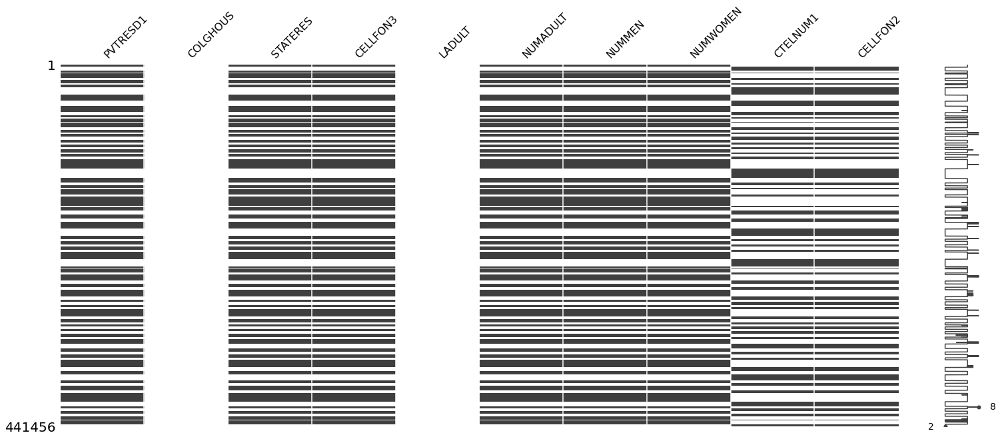

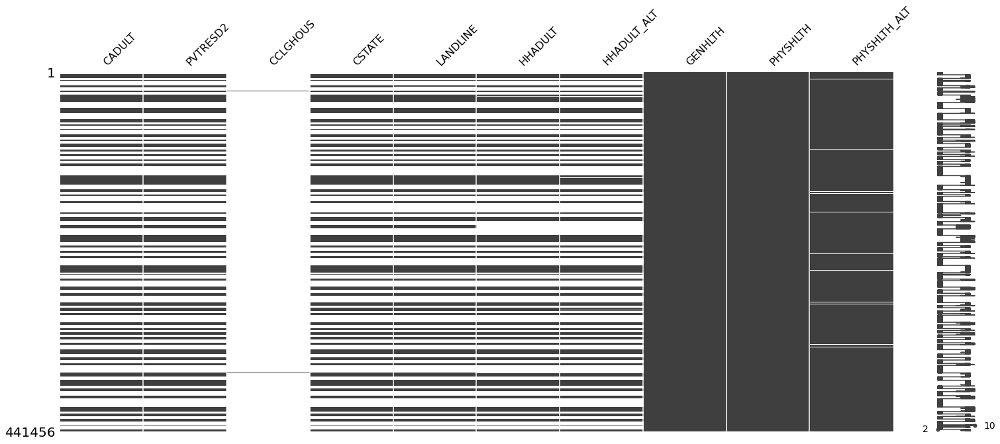

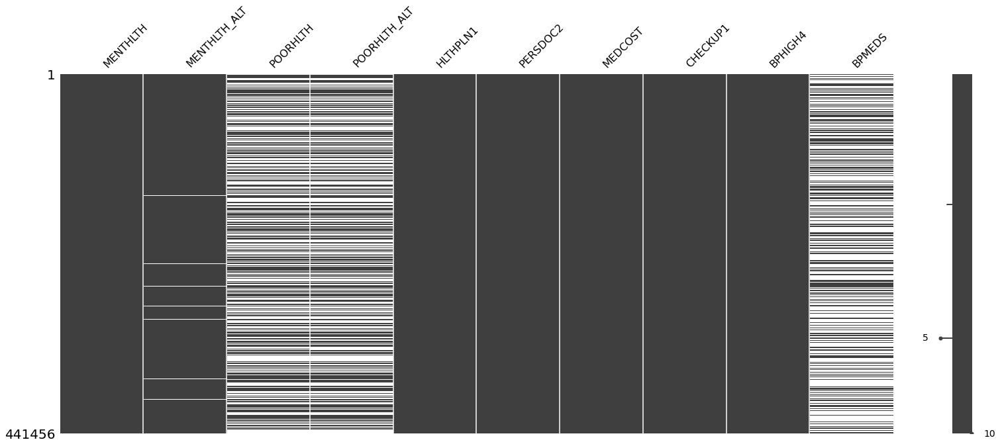

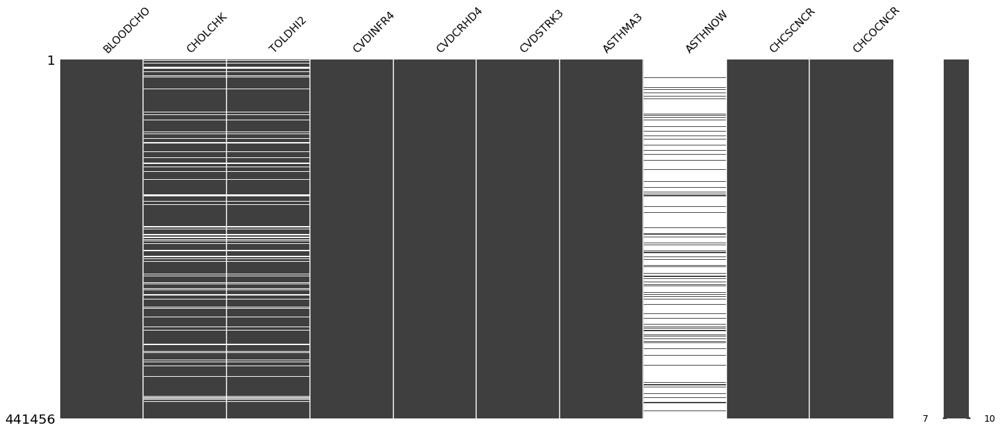

...

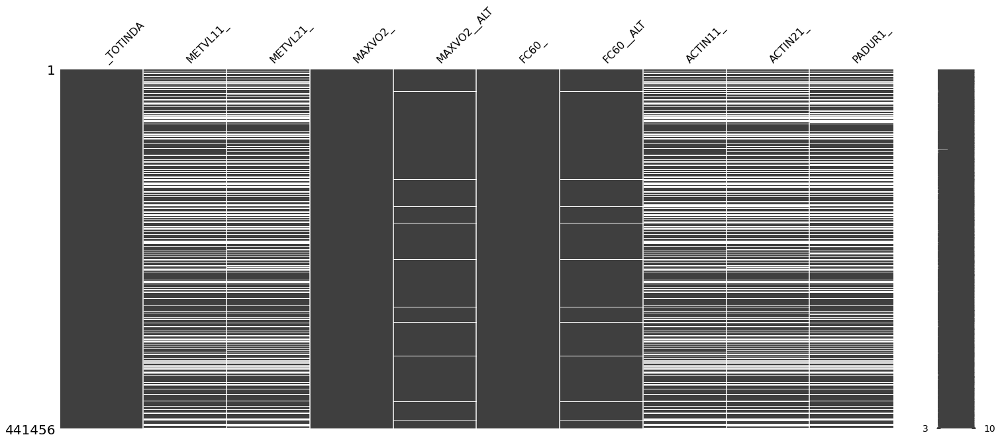

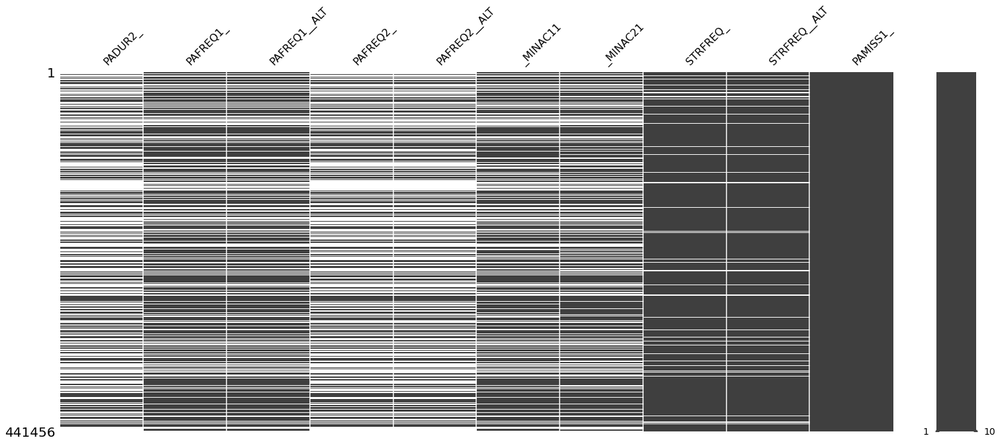

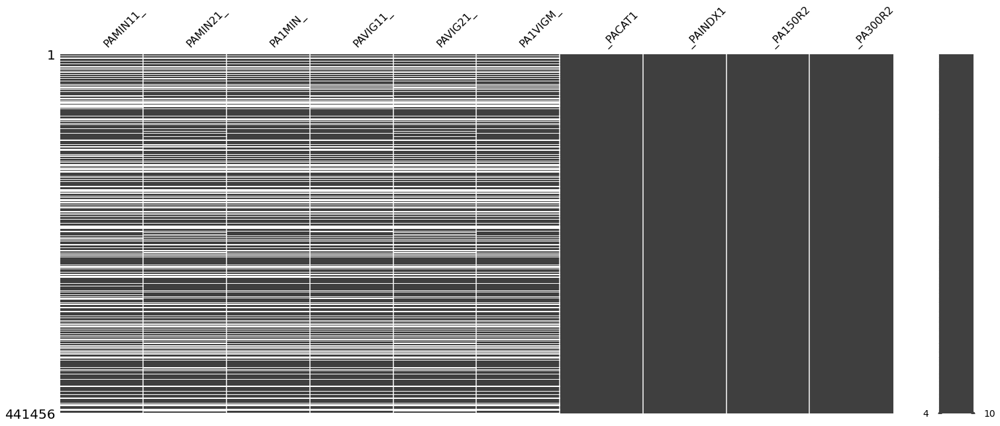

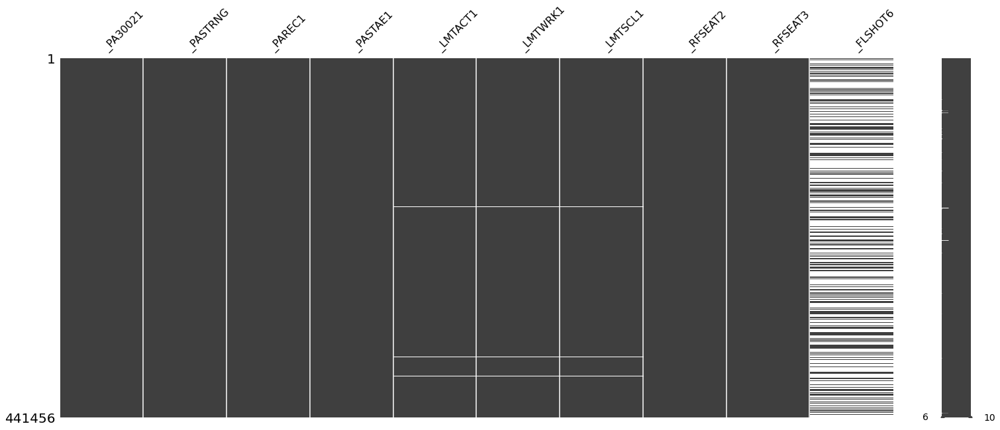

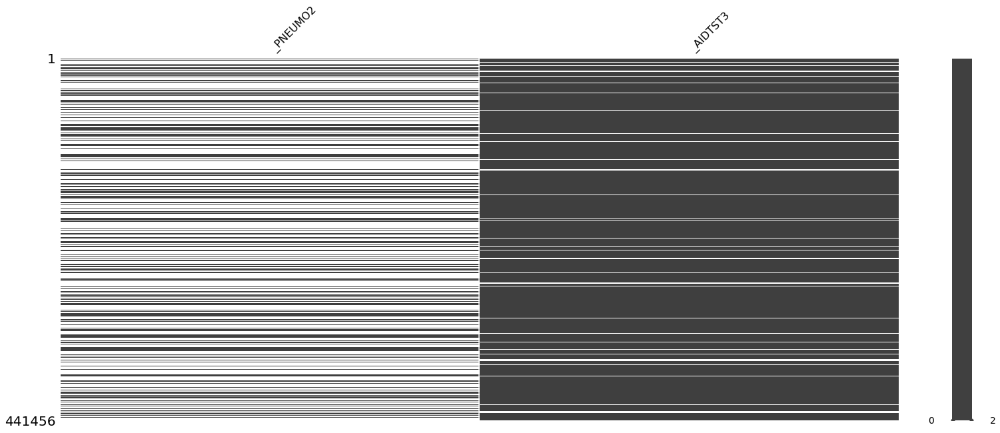

In [19]:
plot_missing(df, 'matrix')

Both types of plots on the previous cell show that, often, there are consecutive rows that have the same proportion of missing values. This is due to the fact that, due to the nature of the survey responses, entire subgroups of survey respondents are skipped over for the next few questions. For example, the column `DIABETE3` asks if the survey respondent has ever been diagnosed with diabetes. If the answer is "No", the next couple of questions are skipped because they are only relevant for people who have diabetes (For example, the question "How old were you when you were diagnosed with diabetes"). 

### 3.6.2 Adding Category for Missing Values in Categorical Features
I will add a numeric value that is not used by any of the columns, such as the value 999.0

**Checking if the value 999.0 is already in use by the dataframe**

In [20]:
cols_cat = df.select_dtypes(include='category').columns

any([999.0 in df[c].unique() for c in cols_cat])

False

**Add the category 999.0 to all categorical columns. It represents missing values. Then, checking that there are no nan values in the categorical features**

In [21]:
for c in cols_cat:
    if any(df[c].isnull()):
        df[c] = df[c].cat.add_categories([999.0])
        df[c] = df[c].fillna(value=999.0)

In [22]:
df.select_dtypes(include='category').isnull().sum().sum()

0

### 3.6.3 Imputing Missing Values in Non-Categorical Columns
After examining the missing values of the Non-Categorical Columns, I decided to do three different things to get rid of the missing values.

First, some columns are missing a large number of entries because the corresponding survey questions are being asked to a small subgroup of the population. For example, a large number of survey questions only asked people who answered "Yes" to the question "Have you ever been diagnosed with diabetes". To simplify the analysis, these columns will simply be dropped since the previous question asking whether the survey respondent has or does not have the condition is more important.

Second, if the entries in the column are integers, their missing values will be replaced with the mode.

Third, if the entries in the column are non-integers, the missing values will be imputed with the median. The choice came from the fact that the majority of the features have very long tails, so the median is a better representation of the central tendency because it is less susceptible to outliers.

In [23]:
#Columns to drop
cols_to_drop = ['POORHLTH_ALT', 'DIABAGE2_ALT', 'AVEDRNK2_ALT', 'DRNK3GE5_ALT', 'MAXDRNKS_ALT', \
                'BLDSUGAR_ALT', 'FEETCHK2_ALT', 'DOCTDIAB_ALT', 'CHKHEMO3_ALT', 'FEETCHK_ALT', \
                'LONGWTCH_ALT', 'ASTHMAGE_ALT', 'ASERVIST_ALT', 'ASDRVIST_ALT', 'ASRCHKUP_ALT', \
                'ASACTLIM_ALT', 'SCNTWRK1_ALT', 'SCNTLWK1_ALT', '_STRWT', '_CLLCPWT', '_DUALCOR', \
                'EXACTOT1', 'EXACTOT2']

#Columns to impute with mode
cols_imp_mode = ['NUMADULT', 'NUMMEN', 'NUMWOMEN', 'HHADULT_ALT', 'PHYSHLTH_ALT', 'MENTHLTH_ALT', \
                 'CHILDREN_ALT', 'ALCDAY5_ALT', 'ADPLEASR_ALT', 'ADDOWN_ALT', 'ADSLEEP_ALT', 'ADENERGY_ALT', \
                 'ADEAT1_ALT', 'ADFAIL_ALT', 'ADTHINK_ALT', 'ADMOVE_ALT', 'FTJUDA1_', 'FRUTDA1_', 'BEANDAY_', \
                 'GRENDAY_', 'ORNGDAY_', 'VEGEDA1_', '_FRUTSUM', '_VEGESUM']

#Columns to impute with median
cols_imp_median = ['HTIN4', 'HTM4', 'WTKG3_ALT', '_BMI5', 'METVL11_', 'METVL21_', 'MAXVO2__ALT', 'FC60__ALT', \
                   'PADUR1_', 'PADUR2_', 'PAFREQ1__ALT', 'PAFREQ2__ALT', '_MINAC11', '_MINAC21', \
                   'STRFREQ__ALT', 'PAMIN11_', 'PAMIN21_', 'PA1MIN_', 'PAVIG11_', 'PAVIG21_', 'PA1VIGM_',\
                  'DROCDY3__ALT', '_DRNKWEK_ALT']

In [24]:
#cols_to_alt contain all non-categorical features that had to be altered. By excluding them, only the 
#"altered versions" of the feeatures are kept in the final dataframe.
df = df[[c for c in df.columns if c not in cols_to_alt]]

#Droping columns, imputing with mode, and imputing with median.
df = df.drop(columns=cols_to_drop)
df = df.fillna(df[cols_imp_mode].mode().iloc[0, :])
df = df.fillna(df[cols_imp_median].median())

## 3.7 Final, Cleaned Dataframe

In [25]:
df_cleaned = df

In [26]:
df_cleaned.isnull().sum().sum()

0

In [27]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 441456 entries, 0 to 441455
Columns: 290 entries, _STATE to _AIDTST3
dtypes: category(235), datetime64[ns](1), float64(54)
memory usage: 286.9 MB


# 4 Plotting

## 4.1 Splitting Categorical and Non-Categorical Data
The recently cleaned dataframe will be split into two dataframes: one containing the categorical features, and the other containing the non-categorical features.

In [28]:
cols_non_cat = df_cleaned.select_dtypes(include='float').columns

#If feature was altered, only include the altered column
cols_alt = [c for c in cols_non_cat if c not in cols_to_alt]

df_non_cat = df_cleaned[cols_alt]
df_cat = df_cleaned.select_dtypes(include='category')

In [29]:
df_cat

,_STATE,FMONTH,IMONTH,IDAY,IYEAR,DISPCODE,SEQNO,_PSU,CTELENUM,PVTRESD1,...,_PAREC1,_PASTAE1,_LMTACT1,_LMTWRK1,_LMTSCL1,_RFSEAT2,_RFSEAT3,_FLSHOT6,_PNEUMO2,_AIDTST3
0,1.0,1.0,1.0,29.0,2015.0,1200.0,2.015000e+09,2.015000e+09,1.0,1.0,...,4.0,2.0,1.0,1.0,1.0,1.0,1.0,999.0,999.0,1.0
1,1.0,1.0,1.0,20.0,2015.0,1100.0,2.015000e+09,2.015000e+09,1.0,1.0,...,2.0,2.0,3.0,3.0,4.0,2.0,2.0,999.0,999.0,2.0
2,1.0,1.0,2.0,1.0,2015.0,1200.0,2.015000e+09,2.015000e+09,1.0,1.0,...,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,999.0
3,1.0,1.0,1.0,14.0,2015.0,1100.0,2.015000e+09,2.015000e+09,1.0,1.0,...,4.0,2.0,1.0,1.0,1.0,1.0,1.0,999.0,999.0,9.0
4,1.0,1.0,1.0,14.0,2015.0,1100.0,2.015000e+09,2.015000e+09,1.0,1.0,...,4.0,2.0,1.0,1.0,1.0,1.0,1.0,999.0,999.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441451,72.0,11.0,12.0,16.0,2015.0,1100.0,2.015005e+09,2.015005e+09,999.0,999.0,...,4.0,2.0,2.0,2.0,3.0,1.0,1.0,2.0,2.0,2.0
441452,72.0,11.0,12.0,14.0,2015.0,1100.0,2.015005e+09,2.015005e+09,999.0,999.0,...,2.0,2.0,3.0,3.0,4.0,1.0,1.0,999.0,999.0,1.0
441453,72.0,11.0,12.0,23.0,2015.0,1200.0,2.015005e+09,2.015005e+09,999.0,999.0,...,9.0,9.0,3.0,3.0,4.0,9.0,9.0,9.0,9.0,999.0
441454,72.0,11.0,12.0,15.0,2015.0,1100.0,2.015005e+09,2.015005e+09,999.0,999.0,...,4.0,2.0,3.0,3.0,4.0,1.0,1.0,999.0,999.0,2.0


In [30]:
df_non_cat

,NUMADULT,NUMMEN,NUMWOMEN,HHADULT_ALT,PHYSHLTH_ALT,MENTHLTH_ALT,CHILDREN_ALT,ALCDAY5_ALT,ADPLEASR_ALT,ADDOWN_ALT,...,PAFREQ2__ALT,_MINAC11,_MINAC21,STRFREQ__ALT,PAMIN11_,PAMIN21_,PA1MIN_,PAVIG11_,PAVIG21_,PA1VIGM_
0,3.0,1.0,2.0,2.0,15.0,18.0,1.0,0.0,0.0,0.0,...,2333.0,140.0,32.0,0.0,180.0,46.0,275.0,0.0,0.0,0.0
1,1.0,0.0,1.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,...,2800.0,168.0,0.0,0.0,168.0,0.0,168.0,0.0,0.0,0.0
2,2.0,1.0,1.0,2.0,15.0,0.0,1.0,0.0,0.0,0.0,...,2333.0,140.0,32.0,0.0,180.0,46.0,275.0,0.0,0.0,0.0
3,3.0,1.0,2.0,2.0,30.0,30.0,1.0,0.0,0.0,0.0,...,2333.0,140.0,32.0,0.0,180.0,46.0,275.0,0.0,0.0,0.0
4,2.0,1.0,1.0,2.0,20.0,0.0,1.0,0.0,0.0,0.0,...,2333.0,140.0,32.0,0.0,180.0,46.0,275.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441451,2.0,1.0,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,...,2333.0,140.0,32.0,0.0,180.0,46.0,275.0,0.0,0.0,0.0
441452,2.0,1.0,1.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,...,2333.0,150.0,0.0,0.0,150.0,0.0,150.0,0.0,0.0,0.0
441453,2.0,1.0,1.0,2.0,0.0,20.0,1.0,0.0,0.0,0.0,...,2333.0,140.0,32.0,0.0,180.0,46.0,275.0,0.0,0.0,0.0
441454,2.0,1.0,1.0,3.0,0.0,0.0,1.0,0.0,0.0,0.0,...,2333.0,140.0,32.0,0.0,180.0,46.0,275.0,0.0,0.0,0.0


## 4.2 Count Plots of Categorical Features
Many of the categorical features have a large number of instances of the "missing" category (which was coded as the value 999.0). To better visualize the distribution of the values of each feature, two plots will be made for each: one that includes the missing values, and one that does not.

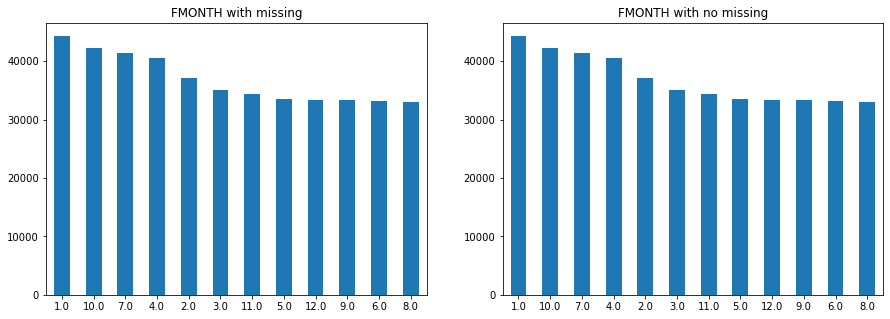

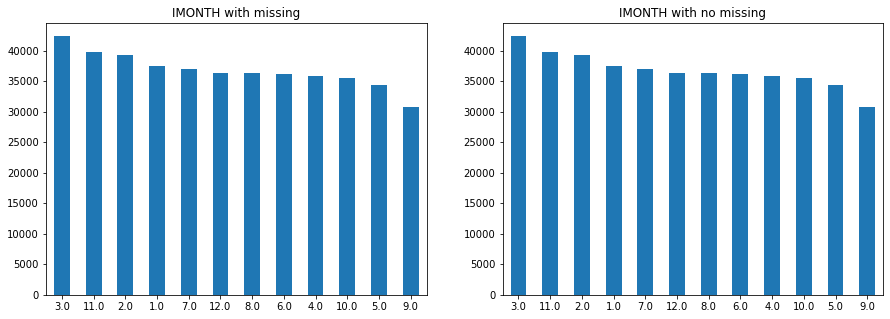

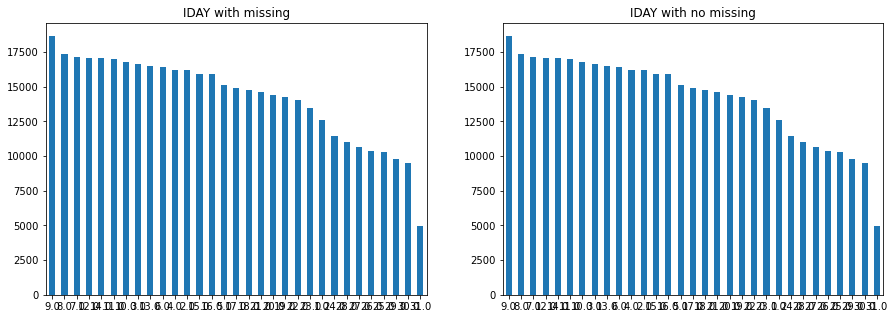

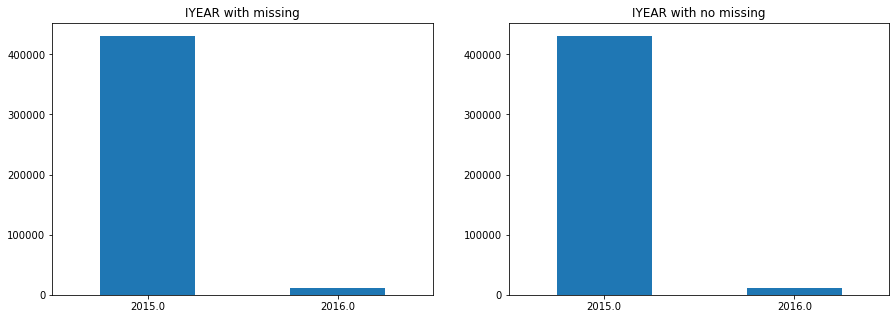

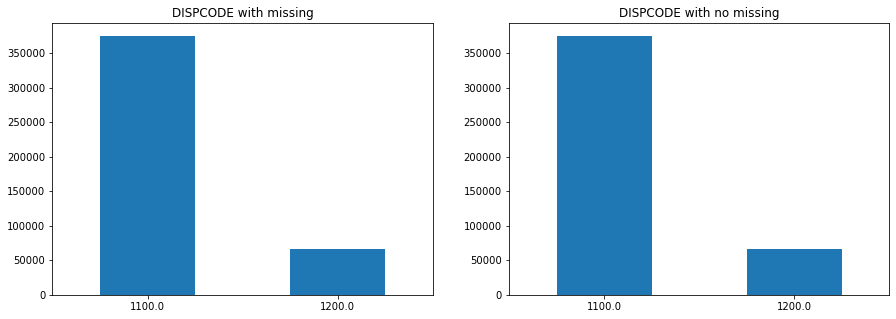

...

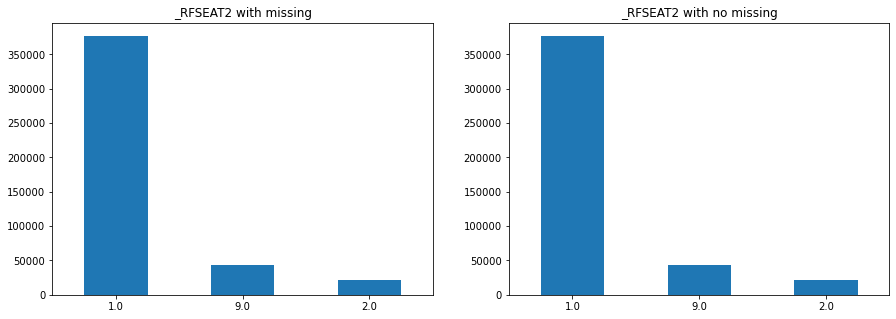

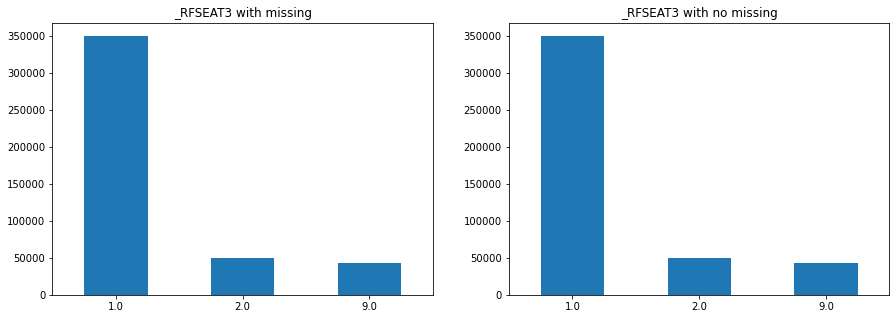

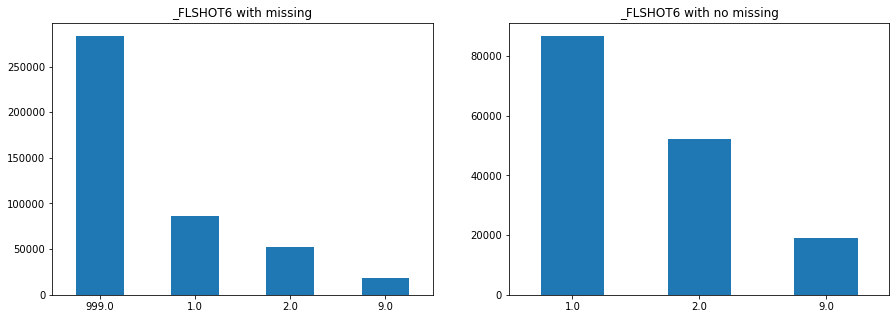

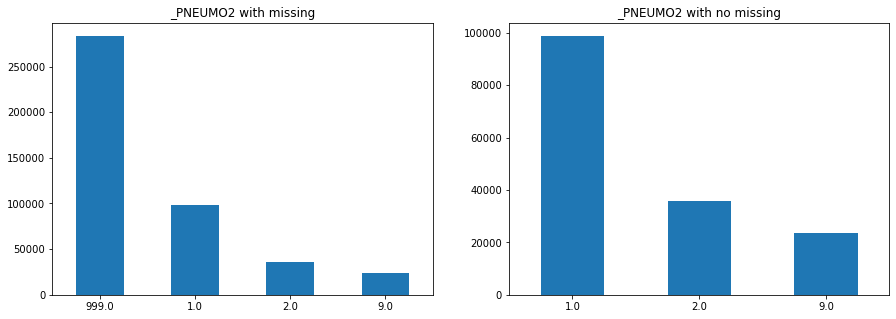

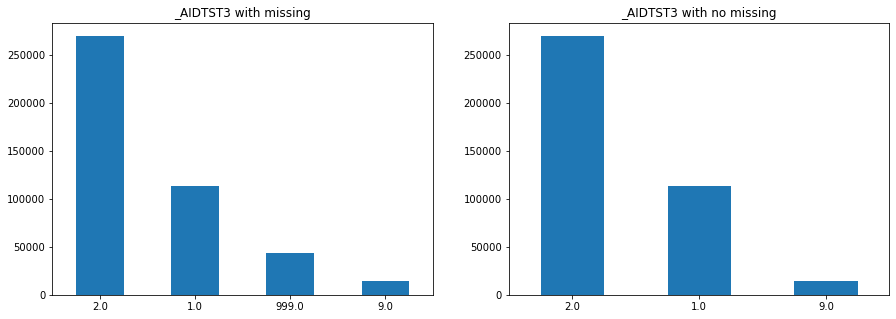

In [31]:
#Some categorical features have too many categories. I will exclude these the features
#to be plotted.
cat_long_tails_cols = ['_STATE', 'SEQNO', '_PSU', 'EXRACT11', 'EXRACT21', 'FLSHTMY2', 'HIVTSTD3']
cols_cat_to_plot = [c for c in df_cat.columns if c not in cat_long_tails_cols]

#Iterate over columns and plot.
for c in cols_cat_to_plot:
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    s1 = df_cat[c].value_counts(dropna=False)
    s2 = s1[s1.index != 999.0]
    s1.plot.bar(ax = axs[0], rot=0)
    axs[0].set_title(c + ' with missing')
    s2.plot.bar(ax = axs[1], rot=0)
    axs[1].set_title(c + ' with no missing')
    plt.show()

We can see that it is very common for many features to be highly imbalanced, i.e., one of its values occurs at a much higher proportion than the rest. This makes sense since many of the questions on the survey ask about the presence of relatively rare health conditions, such as diabetes and heart disease.

## 4.3 Distribution Plots of Non-Categorical Features

**Defining auxiliary function for plotting distribution of non-categorical features**

In [32]:
def plot_dist(dataframe, column, **kargs):
    '''Auxiliary function for plotting distributions of non-categorical columns in a dataframe.
       It has many keyworkds that can control what is ploted. For example, the range of values
       to be plotted can be chosen. It also provides the option to cut off all entries above a 
       centain percentile, which is useful when the distributions have long tails on the right.
       The function also allows for the option to output useful information.'''
    
    s = dataframe[column]
    
    #Filtering the series
    if 'rng' in kargs.keys():
        r_list = kargs['rng']
        if (len(r_list) == 2):
            if r_list[0] == 'min':
                low = s.min()
            else:
                low = r_list[0]
            if r_list[1] == 'max':
                high = s.max()
            else:
                high = r_list[1]
            s_f = s[((s >= low) & (s <= high)) | (np.isnan(s))]
        elif (len(r_list) == 1):
            low = s.min()
            high = r_list[0]
            s_f = s[(s <= high) | (np.isnan(s))]
        else:
            print('plot_counts error: Unallowed number of arguments.')
            return 1
    elif 'percentile_cut' in kargs.keys():
        p = kargs['percentile_cut']
        low = s.min()
        high = np.percentile(s[~np.isnan(s)], p)
        s_f = s[(s <= high) | (np.isnan(s))]
    else:
        low = s.min()
        high = s.max()
        s_f = s
    
    #Creating Q1, Q2, counts series, max count, and value with max count
    Q1, Q3, p99 = np.percentile(s_f[~np.isnan(s_f)], [25, 75, 99])
        
    if 'outliers' in kargs.keys():
        ol = kargs['outliers']
        if ol == False:
            a = (Q3 - Q1) * 1.5
            tw = Q3 + a
            bw = Q1 - a
            s_f = s_f[((s_f >= bw) & (s_f <= tw)) | np.isnan(s_f)]
        elif ol == True:
            pass
        else:
            print('Unallowed value for keyword \'outliers\'.')
            return 1
    
    s_c = s_f.value_counts(dropna=False).sort_index()
    max_c = s_c[~np.isnan(s_c.index)].max()
    max_i = np.array(s_c[s_c == max_c].index)
    
    #Deciding whether to uses a given axes object or create a new one.
    if 'ax' in kargs.keys():
        ax = kargs['ax']
    else:
        _, ax = plt.subplots()
    
    #Deciding type of plot
    if 'kind' in kargs.keys():
        k = kargs['kind']
        if k == 'hist':
            if 'bins' in kargs.keys():
                s_f.plot.hist(bins=kargs['bins'], ax=ax)
            else:
                s_f.plot.hist(ax=ax)
        elif k == 'bar':
            s_c[~np.isnan(s_c.index)].plot.bar(ax=ax)
        elif k == 'box':
            if 'outliers' in kargs.keys():
                ol = kargs['outliers']
                if ol == False:
                    s_f.plot.box(ax=ax, showfliers=False)
                elif ol == True:
                    s_f.plot.box(ax=ax)
                else:
                    print('Unallowed value for keyword \'outlier\'.')
                    return 1
            else:
                s_f.plot.box(ax=ax)
        else:
            print('Unallowed value for keyword \'kind\'.')
            return 1
    else:
        s_f.plot.hist(ax=ax)
        
    #Plot
    if 'name' in kargs.keys():
        ax.set_title(kargs['name'])
    else:
        ax.set_title(column)
    ax.set_xlabel('Values')
    ax.set_ylabel('Counts')
    
    #Output potentially useful information
    if 'output' in kargs.keys():
        out = kargs['output']
        if out not in [True, False]:
            print('Unallowed value for keyword \'output\'.')
            return 1
    else:
        out = True
    
    if out == True:
        print('\nColumn:', column, '\nLow:', low, '\nHigh:', high, '\nMin:', s_f.min(), '\nMax:', s_f.max(), \
         '\nQ1:', Q1, '\nQ3', Q3, '\np99:', p99, '\nMax Index:', max_i, '\nMax Count:', max_c)
        print('Proportion:', s_f.shape[0] / s.shape[0])
        print('\nValue Counts:')
        print(s_c)
    
    return 0

**Defining function that creates the figure and subplots and then plots histograms and boxplots**  
It calls the function defined in the previous cell twice: once to plot a histogram and then again to plot a boxplot

In [33]:
def plots_non_cat(dataframe, **kargs):
    '''This function makes the figures and subplots and then calls the function defined on the 
       previous cell in order to plot on them'''
    tot = 2 * dataframe.shape[1]
    n_axs_cols = 2
    n_axs_rows = tot // n_axs_cols
    rem = tot - n_axs_cols * n_axs_rows

    fig_cols = n_axs_cols
    if rem == 0:
        fig_rows = n_axs_rows
    elif rem > 0:
        fig_rows = n_axs_rows + 1
    else:
        print('Unallowed number of figure rows.')
        return 1
        
    fig, axs = plt.subplots(fig_rows, fig_cols, figsize=kargs['figsize'])
    fig.tight_layout()
    fig.subplots_adjust(hspace=kargs['hspace'], wspace=kargs['wspace'])
    for i, c in enumerate(dataframe.columns):
        plot_dist(dataframe, c, name=c+' histogram', output=False, kind='hist', outliers=kargs['outliers'], \
                  ax=axs.flat[2 * i])
        plot_dist(dataframe, c, name=c+' boxplot', output=False, kind='box', outliers=kargs['outliers'], \
                  ax=axs.flat[2 * i + 1])
    plt.show()
    return 0

In [34]:
#Calculating the figure heights
subplot_height = 4
fig_height = subplot_height * len(df_non_cat.columns)

Since many of the features have long tails on the right, two versions of the plots will be made: one including all values, and another that excludes outliers (defined as the values that fall outside the range of 1.5 times the 25th and 75th quartile)

**Distributions with outliers included**

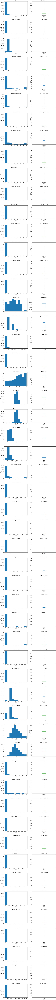

0

In [35]:
plots_non_cat(df_non_cat, figsize=(12, fig_height), wspace=0.2, hspace=0.4, outliers=True)

**Distributions with outliers excluded**

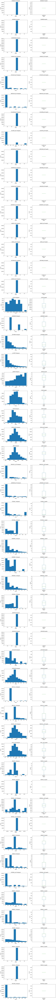

0

In [36]:
plots_non_cat(df_non_cat, figsize=(12, fig_height), wspace=0.2, hspace=0.4, outliers=False)

As previously mentioned, many of these features exhibit long tails. For some of the features, some of these extreme values don't seem to make sense. For example, the feature `DROCDY3_ALT` contains values for the number of drinks that an individual has on a single day on average. Some respondents reported values as high as 80 drinks, which seems extreme. However, these values occur so rarely that the most likely explanation is that these are due to input error, e.g., the surveyor recording an '80' when it should have been an '8'.

Since many features' missing values were imputed with the median, their distributions are bimodal, with one of the modes being the imputation value.

## 4.4 Heatmap for Categorical Features
I would like to see how different health features are correlated. I chose a small subset of the features in the dataframe.

**Making dataframe for subset of categorical features whose correlations I would like to examine**

In [37]:
#Subset of categorical features I would like to examine
cols_cat_sub = ['_RFHLTH', '_RFHYPE5', '_RFCHOL', '_MICHD', '_RFBING5', '_LTASTH1', '_DRDXAR1', '_RFSMOK3',\
                '_RFBMI5']

#Demographics features
cols_demo = ['_RACEGR3', '_AGE_G', '_EDUCAG', '_INCOMG']

df_cat_sub = df_cat[cols_cat_sub + cols_demo]
df_cat_sub

,_RFHLTH,_RFHYPE5,_RFCHOL,_MICHD,_RFBING5,_LTASTH1,_DRDXAR1,_RFSMOK3,_RFBMI5,_RACEGR3,_AGE_G,_EDUCAG,_INCOMG
0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,2.0,1.0,5.0,2.0,2.0
1,1.0,1.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0,1.0,4.0,4.0,1.0
2,2.0,1.0,2.0,999.0,9.0,1.0,1.0,9.0,1.0,1.0,6.0,2.0,9.0
3,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,5.0,2.0,5.0
4,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,5.0,3.0,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
441451,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,5.0,6.0,1.0,2.0
441452,1.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,2.0,5.0,2.0,3.0,1.0
441453,2.0,2.0,2.0,2.0,1.0,1.0,2.0,1.0,2.0,5.0,6.0,2.0,3.0
441454,1.0,2.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,5.0,4.0,3.0,1.0


**Swapping numeric labels for "Yes" and "No"**  
For most categorical features in this dataset, "No" is coded as "1.0" and "Yes" is coded as "2.0". However, it is the other way around for some features. The next cell changes the labels of three of the features in the dataframe defined in the previous cell so that all values of "1.0" become "2.0" and vice versa. After this swap, values of "1.0" will correspond to "No" and values of "2.0" will correspond to "Yes" for all features.

In [38]:
for c in ['_RFHLTH', '_MICHD', '_DRDXAR1']:
    df_cat_sub[c] = df_cat_sub[c].apply(lambda x: 2.0 if x == 1.0 else 1.0 if x == 2.0 else x)

/tmp/ipykernel_255149/3913282474.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cat_sub[c] = df_cat_sub[c].apply(lambda x: 2.0 if x == 1.0 else 1.0 if x == 2.0 else x)
/tmp/ipykernel_255149/3913282474.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cat_sub[c] = df_cat_sub[c].apply(lambda x: 2.0 if x == 1.0 else 1.0 if x == 2.0 else x)
/tmp/ipykernel_255149/3913282474.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,co

**Making translation dictionary**  
All columns in the previously defined dataframe will be translated to more descriptive titles. Their values will also be changed from numbers to descriptive strings.

In [39]:
#Dictionary for the demographics. The keys are current names of the columns, and the values is a list of
#two items. The first item on the list is the column translation, while the second item is a dictionary
#for translating the numeric values into descriptive strings
trans_demo = {'_RACEGR3':[
             'Race', {
                 1.0:'White',
                 2.0:'Black',
                 3.0:'Other',
                 4.0:'Multiracial',
                 5.0:'Hispanic',
                 9.0:'Unknown'}],
         '_AGE_G':[
             'Age Group', {
                 1.0:'18 to 24',
                 2.0:'25 to 34',
                 3.0:'35 to 44',
                 4.0:'45 to 54',
                 5.0:'55 to 64',
                 6.0:'65 of older'}],
         '_EDUCAG':[
             'Education', {
                 1.0:'Did not graduate High School',
                 2.0:'Graduated High School',
                 3.0:'Attended College or Technical School',
                 4.0:'Graduated from College or Technical School',
                 9.0:'Unknown'}],
         '_INCOMG':[
             'Income Category', {
                 1.0:'Less than $15,000',
                 2.0:'$15,000 to $25,000',
                 3.0:'$25,000 to $35,000',
                 4.0:'$35,000 to $50,000',
                 9.0:'Unknown'}]}

#Dictionary for translating columns and values of health related features 
trans_health_cols = ['Good Health', 'Hypertension', 'High Cholesterol', 'Heart Disease', \
              'Binge Drinker', 'Asthma', 'Arthritis', 'Smoker', 'Overweight']
trans_health_vals = {1.0:'No', 2.0:'Yes', 9.0:'Unknown', 999.0:'Missing'}

#Make dictionary for health-related features in the same format as the previous dictionary for demographics.
trans_health = dict(zip(cols_cat_sub, [[c, trans_health_vals] for c in trans_health_cols]))

#Combine both dictionaries
trans_cat = trans_demo.copy()
trans_cat.update(trans_health)
trans_cat

{'_RACEGR3': ['Race',
  {1.0: 'White',
   2.0: 'Black',
   3.0: 'Other',
   4.0: 'Multiracial',
   5.0: 'Hispanic',
   9.0: 'Unknown'}],
 '_AGE_G': ['Age Group',
  {1.0: '18 to 24',
   2.0: '25 to 34',
   3.0: '35 to 44',
   4.0: '45 to 54',
   5.0: '55 to 64',
   6.0: '65 of older'}],
 '_EDUCAG': ['Education',
  {1.0: 'Did not graduate High School',
   2.0: 'Graduated High School',
   3.0: 'Attended College or Technical School',
   4.0: 'Graduated from College or Technical School',
   9.0: 'Unknown'}],
 '_INCOMG': ['Income Category',
  {1.0: 'Less than $15,000',
   2.0: '$15,000 to $25,000',
   3.0: '$25,000 to $35,000',
   4.0: '$35,000 to $50,000',
   9.0: 'Unknown'}],
 '_RFHLTH': ['Good Health',
  {1.0: 'No', 2.0: 'Yes', 9.0: 'Unknown', 999.0: 'Missing'}],
 '_RFHYPE5': ['Hypertension',
  {1.0: 'No', 2.0: 'Yes', 9.0: 'Unknown', 999.0: 'Missing'}],
 '_RFCHOL': ['High Cholesterol',
  {1.0: 'No', 2.0: 'Yes', 9.0: 'Unknown', 999.0: 'Missing'}],
 '_MICHD': ['Heart Disease',
  {1.0: 'No',

**Translating columns and values of categorical features dataframe**

In [40]:
for k, l in trans_cat.items():
    df_cat_sub[k] = df_cat_sub[k].map(l[1])
    df_cat_sub = df_cat_sub.rename(columns=dict([[k, l[0]]]))
df_cat_sub

/tmp/ipykernel_255149/3948976121.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cat_sub[k] = df_cat_sub[k].map(l[1])


,Good Health,Hypertension,High Cholesterol,Heart Disease,Binge Drinker,Asthma,Arthritis,Smoker,Overweight,Race,Age Group,Education,Income Category
0,No,Yes,Yes,No,No,Yes,Yes,No,Yes,White,55 to 64,Graduated High School,"$15,000 to $25,000"
1,Yes,No,No,No,No,No,No,Yes,Yes,White,45 to 54,Graduated from College or Technical School,"Less than $15,000"
2,No,No,Yes,Missing,Unknown,No,Yes,Unknown,No,White,65 of older,Graduated High School,Unknown
3,No,Yes,Yes,No,No,No,Yes,No,Yes,White,55 to 64,Graduated High School,NaN
4,No,No,No,No,No,No,Yes,No,No,White,55 to 64,Attended College or Technical School,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...
441451,No,Yes,Yes,No,No,No,Yes,No,No,Hispanic,65 of older,Did not graduate High School,"$15,000 to $25,000"
441452,Yes,No,No,No,No,No,No,No,Yes,Hispanic,25 to 34,Attended College or Technical School,"Less than $15,000"
441453,No,Yes,Yes,No,No,No,No,No,Yes,Hispanic,65 of older,Graduated High School,"$25,000 to $35,000"
441454,Yes,Yes,No,No,No,No,No,No,No,Hispanic,45 to 54,Attended College or Technical School,"Less than $15,000"


**One-hot encoding of previous dataframe**

In [41]:
df_cat_one_hot = pd.get_dummies(df_cat_sub)
df_cat_one_hot

,Good Health_Yes,Good Health_No,Good Health_Unknown,Hypertension_No,Hypertension_Yes,Hypertension_Unknown,High Cholesterol_No,High Cholesterol_Yes,High Cholesterol_Unknown,High Cholesterol_Missing,...,Education_Did not graduate High School,Education_Graduated High School,Education_Attended College or Technical School,Education_Graduated from College or Technical School,Education_Unknown,"Income Category_$15,000 to $25,000","Income Category_$25,000 to $35,000","Income Category_$35,000 to $50,000","Income Category_Less than $15,000",Income Category_Unknown
0,0,1,0,0,1,0,0,1,0,0,...,0,1,0,0,0,1,0,0,0,0
1,1,0,0,1,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,1,0
2,0,1,0,1,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,1
3,0,1,0,0,1,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,1,0,1,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441451,0,1,0,0,1,0,0,1,0,0,...,1,0,0,0,0,1,0,0,0,0
441452,1,0,0,1,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,1,0
441453,0,1,0,0,1,0,0,1,0,0,...,0,1,0,0,0,0,1,0,0,0
441454,1,0,0,0,1,0,1,0,0,0,...,0,0,1,0,0,0,0,0,1,0


**Correlation Matrix**

In [42]:
df_corr = df_cat_one_hot.corr() 
df_corr

,Good Health_Yes,Good Health_No,Good Health_Unknown,Hypertension_No,Hypertension_Yes,Hypertension_Unknown,High Cholesterol_No,High Cholesterol_Yes,High Cholesterol_Unknown,High Cholesterol_Missing,...,Education_Did not graduate High School,Education_Graduated High School,Education_Attended College or Technical School,Education_Graduated from College or Technical School,Education_Unknown,"Income Category_$15,000 to $25,000","Income Category_$25,000 to $35,000","Income Category_$35,000 to $50,000","Income Category_Less than $15,000",Income Category_Unknown
Good Health_Yes,1.000000,-0.990771,-0.110293,0.219697,-0.218575,-0.012270,0.122826,-0.145502,-0.018270,0.029837,...,-0.190394,-0.086070,0.009078,0.178929,-0.010859,-0.121402,-0.024285,0.031328,-0.203645,-0.032557
Good Health_No,-0.990771,1.000000,-0.025447,-0.219175,0.218568,0.007717,-0.121992,0.146079,0.015842,-0.031239,...,0.187732,0.086144,-0.008393,-0.177631,0.006925,0.121905,0.024771,-0.030463,0.202786,0.028787
Good Health_Unknown,-0.110293,-0.025447,1.000000,-0.013190,0.009366,0.033907,-0.011351,0.001965,0.018581,0.009009,...,0.027634,0.003132,-0.005409,-0.017149,0.029304,0.001484,-0.002524,-0.007680,0.014984,0.029036
Hypertension_No,0.219697,-0.219175,-0.013190,1.000000,-0.993596,-0.067311,0.189827,-0.323277,-0.029984,0.185430,...,-0.064388,-0.066064,-0.002103,0.099195,0.000187,-0.056143,-0.029652,-0.013108,-0.064504,-0.017540
Hypertension_Yes,-0.218575,0.218568,0.009366,-0.993596,1.000000,-0.045852,-0.187865,0.325230,0.017531,-0.187795,...,0.063294,0.066089,0.002512,-0.098334,-0.005128,0.056960,0.030167,0.014114,0.064366,0.012157
Hypertension_Unknown,-0.012270,0.007717,0.033907,-0.067311,-0.045852,1.000000,-0.019362,-0.013771,0.110288,0.018889,...,0.010349,0.000493,-0.003589,-0.008675,0.043624,-0.006610,-0.004226,-0.008746,0.001915,0.047724
High Cholesterol_No,0.122826,-0.121992,-0.011351,0.189827,-0.187865,-0.019362,1.000000,-0.747206,-0.089382,-0.389886,...,-0.069999,-0.058926,-0.000353,0.094630,-0.004215,-0.046792,-0.020006,-0.001591,-0.064242,-0.024607
High Cholesterol_Yes,-0.145502,0.146079,0.001965,-0.323277,0.325230,-0.013771,-0.747206,1.000000,-0.067982,-0.296538,...,0.014225,0.016109,-0.003666,-0.018352,-0.008718,0.012617,0.009960,0.006473,0.021806,-0.009555
High Cholesterol_Unknown,-0.018270,0.015842,0.018581,-0.029984,0.017531,0.110288,-0.089382,-0.067982,1.000000,-0.035472,...,0.005930,0.005306,-0.002685,-0.008558,0.021153,-0.001734,-0.000399,-0.005958,0.002354,0.038333
High Cholesterol_Missing,0.029837,-0.031239,0.009009,0.185430,-0.187795,0.018889,-0.389886,-0.296538,-0.035472,1.000000,...,0.081109,0.062363,0.006397,-0.110747,0.012935,0.051329,0.015414,-0.005234,0.062902,0.039534


**Generating the heatmap between categorical features**

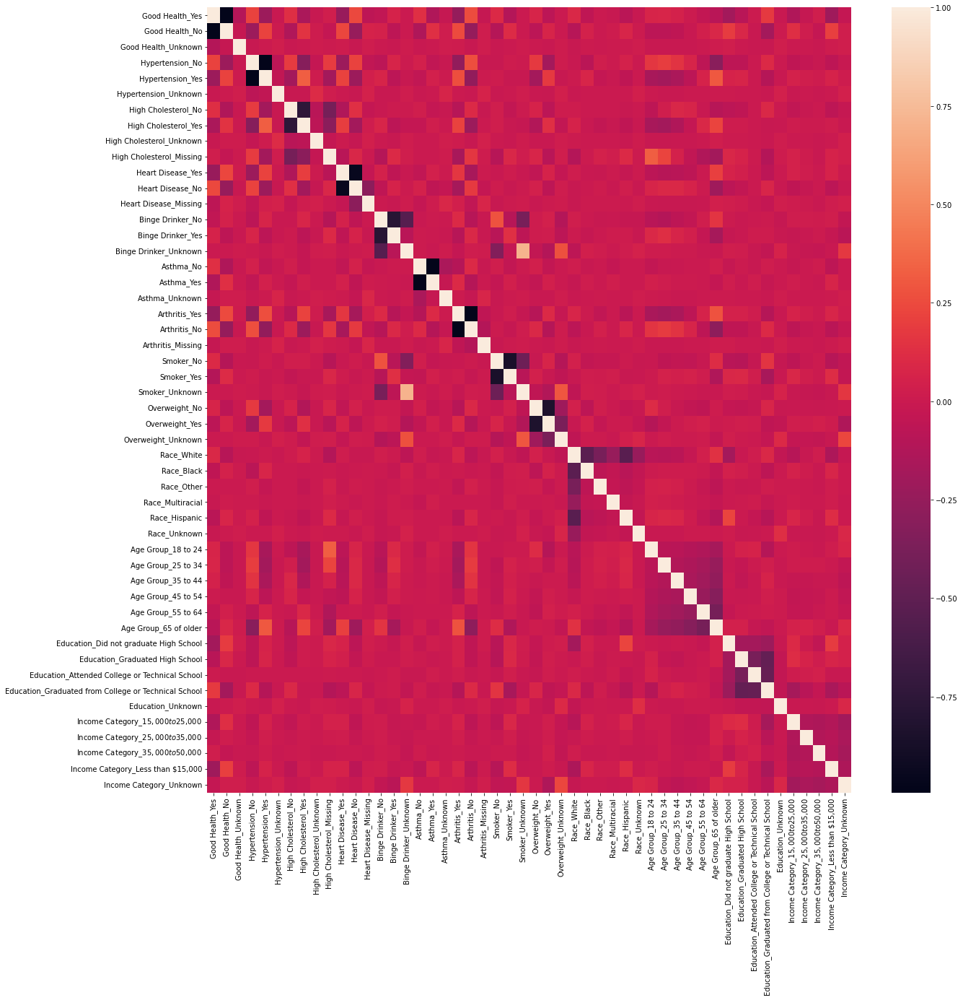

In [43]:
dim = 20
plt.figure(figsize=(dim, dim))
sns.heatmap(df_corr)
plt.show()

**Generating a list of pairs of categorical features with correlation coefficients with absolute values above some threshold**  
Looking at the heatmap, there does not seem to be particularly strong correlations between pairs of features. To confirm this, the next cell will return the pairs of features that have a correlation coefficient above some threshold. However, it will not return pairs of one-hot features from the same group (for example, `Good Health_Yes` with `Good Health_No`) because there are naturally correlated by definition.

In [44]:
import re

high_corr_list = []
cutoff = 0.3
num_cols = df_corr.shape[1]
for i, c in enumerate(df_corr.columns):
    s_temp = df_corr.iloc[:, i]
    c_striped = re.sub(r'_.*$', '', c)
    for j in range(i + 1, num_cols):
        index = s_temp.index[j]
        index_striped = re.sub(r'_.*$', '', index)
        #This conditional makes sure to exclude features from the same one-hot group
        if c_striped != index_striped:
            if abs(s_temp[index]) >= cutoff:
                high_corr_list.append((c, index, s_temp[index]))
high_corr_list

[('Hypertension_No', 'High Cholesterol_Yes', -0.32327658505071105),
 ('Hypertension_No', 'Age Group_65 of older', -0.30057012301434927),
 ('Hypertension_Yes', 'High Cholesterol_Yes', 0.3252301153855923),
 ('High Cholesterol_Missing', 'Age Group_18 to 24', 0.3238505511422781),
 ('Binge Drinker_No', 'Smoker_Unknown', -0.3814162561673781),
 ('Binge Drinker_Unknown', 'Smoker_No', -0.33188658873175103),
 ('Binge Drinker_Unknown', 'Smoker_Unknown', 0.7048262937499875)]

`Binge Drinker_Unknown` and `Smoker_Unknown` seem to be highly correlated. A possible explanation for this is that individuals who are both binge drinkers and smokers are less inclined to disclose in a survey that they are.

The rest of the features have correlation coefficient absolute values less than about 0.38. Therefore, I conclude that there doesn't seem to be a strong correlation between the different categorical health features in the data.

## 4.5 Scatter Plots and Heatmap for Categorical Features
Just as with the case of categorical features, I wish to examine if there are significant correlations between different non-categorical features. I will only concentrate on a chosen sub-category of features to make the visualizations manageable.

**Creating dataframe containing subset of non-categorical features to examine**

In [45]:
df_non_cat.columns

Index(['NUMADULT', 'NUMMEN', 'NUMWOMEN', 'HHADULT_ALT', 'PHYSHLTH_ALT',
       'MENTHLTH_ALT', 'CHILDREN_ALT', 'ALCDAY5_ALT', 'ADPLEASR_ALT',
       'ADDOWN_ALT', 'ADSLEEP_ALT', 'ADENERGY_ALT', 'ADEAT1_ALT', 'ADFAIL_ALT',
       'ADTHINK_ALT', 'ADMOVE_ALT', '_STSTR', '_RAWRAKE', '_WT2RAKE',
       '_LLCPWT', '_AGE80', 'HTIN4', 'HTM4', 'WTKG3_ALT', '_BMI5',
       'DROCDY3__ALT', '_DRNKWEK_ALT', 'FTJUDA1_', 'FRUTDA1_', 'BEANDAY_',
       'GRENDAY_', 'ORNGDAY_', 'VEGEDA1_', '_MISFRTN', '_MISVEGN', '_FRUTSUM',
       '_VEGESUM', 'METVL11_', 'METVL21_', 'MAXVO2__ALT', 'FC60__ALT',
       'PADUR1_', 'PADUR2_', 'PAFREQ1__ALT', 'PAFREQ2__ALT', '_MINAC11',
       '_MINAC21', 'STRFREQ__ALT', 'PAMIN11_', 'PAMIN21_', 'PA1MIN_',
       'PAVIG11_', 'PAVIG21_', 'PA1VIGM_'],
      dtype='object')

In [46]:
#Subset of categorical features I would like to examine
cols_non_cat_sub = ['PHYSHLTH_ALT', 'MENTHLTH_ALT', '_DRNKWEK_ALT', 'ADPLEASR_ALT', '_AGE80', 'HTM4',\
                    'WTKG3_ALT', '_BMI5', 'PA1MIN_']
df_non_cat_sub = df_non_cat[cols_non_cat_sub]
df_non_cat_sub

,PHYSHLTH_ALT,MENTHLTH_ALT,_DRNKWEK_ALT,ADPLEASR_ALT,_AGE80,HTM4,WTKG3_ALT,_BMI5,PA1MIN_
0,15.0,18.0,0.0,0.0,63.0,178.0,12701.0,4018.0,275.0
1,0.0,0.0,0.0,0.0,52.0,173.0,7484.0,2509.0,168.0
2,15.0,0.0,0.0,0.0,71.0,180.0,7167.0,2204.0,275.0
3,30.0,30.0,0.0,0.0,63.0,170.0,8165.0,2819.0,275.0
4,20.0,0.0,0.0,0.0,61.0,163.0,6441.0,2437.0,275.0
...,...,...,...,...,...,...,...,...,...
441451,0.0,0.0,0.0,0.0,72.0,160.0,4717.0,1842.0,275.0
441452,0.0,0.0,0.0,0.0,29.0,160.0,7257.0,2834.0,150.0
441453,0.0,20.0,93.0,0.0,70.0,165.0,11204.0,4110.0,275.0
441454,0.0,0.0,0.0,0.0,52.0,180.0,7530.0,2315.0,275.0


**Translating the column names to more descriptive names**

In [47]:
trans_non_cat_cols = ['Phys_Health (Days)', 'Ment_Health (Days)', 'Num_Drinks_per_Week', \
               'No_Pleassure (Days)', 'Age', 'Height (m)', 'Weight (kg)', 'BMI', 'Phys_Act (min)']
trans_non_cat = dict(zip(cols_non_cat_sub, trans_non_cat_cols))
trans_non_cat

{'PHYSHLTH_ALT': 'Phys_Health (Days)',
 'MENTHLTH_ALT': 'Ment_Health (Days)',
 '_DRNKWEK_ALT': 'Num_Drinks_per_Week',
 'ADPLEASR_ALT': 'No_Pleassure (Days)',
 '_AGE80': 'Age',
 'HTM4': 'Height (m)',
 'WTKG3_ALT': 'Weight (kg)',
 '_BMI5': 'BMI',
 'PA1MIN_': 'Phys_Act (min)'}

In [48]:
df_non_cat_sub = df_non_cat_sub.rename(columns=trans_non_cat)

df_non_cat_sub

,Phys_Health (Days),Ment_Health (Days),Num_Drinks_per_Week,No_Pleassure (Days),Age,Height (m),Weight (kg),BMI,Phys_Act (min)
0,15.0,18.0,0.0,0.0,63.0,178.0,12701.0,4018.0,275.0
1,0.0,0.0,0.0,0.0,52.0,173.0,7484.0,2509.0,168.0
2,15.0,0.0,0.0,0.0,71.0,180.0,7167.0,2204.0,275.0
3,30.0,30.0,0.0,0.0,63.0,170.0,8165.0,2819.0,275.0
4,20.0,0.0,0.0,0.0,61.0,163.0,6441.0,2437.0,275.0
...,...,...,...,...,...,...,...,...,...
441451,0.0,0.0,0.0,0.0,72.0,160.0,4717.0,1842.0,275.0
441452,0.0,0.0,0.0,0.0,29.0,160.0,7257.0,2834.0,150.0
441453,0.0,20.0,93.0,0.0,70.0,165.0,11204.0,4110.0,275.0
441454,0.0,0.0,0.0,0.0,52.0,180.0,7530.0,2315.0,275.0


**Making the scatterplot pairplots**

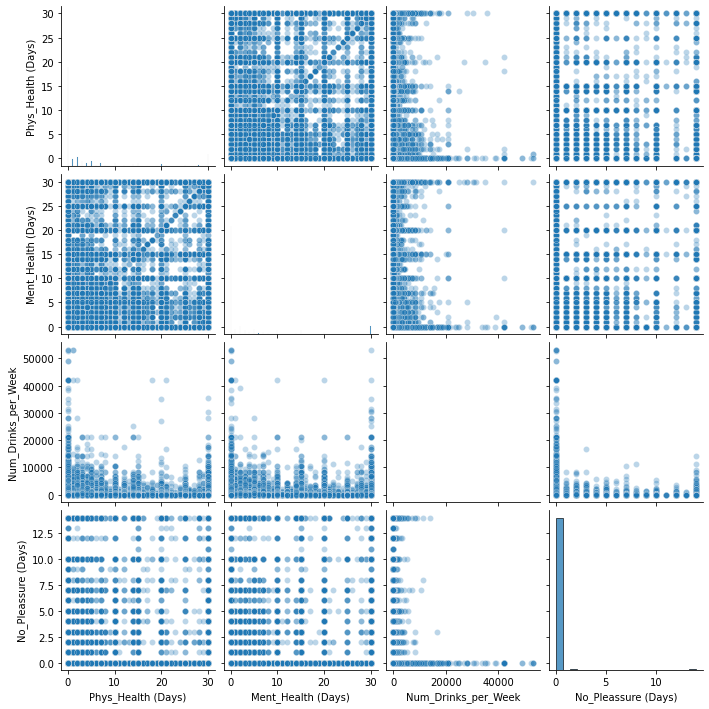

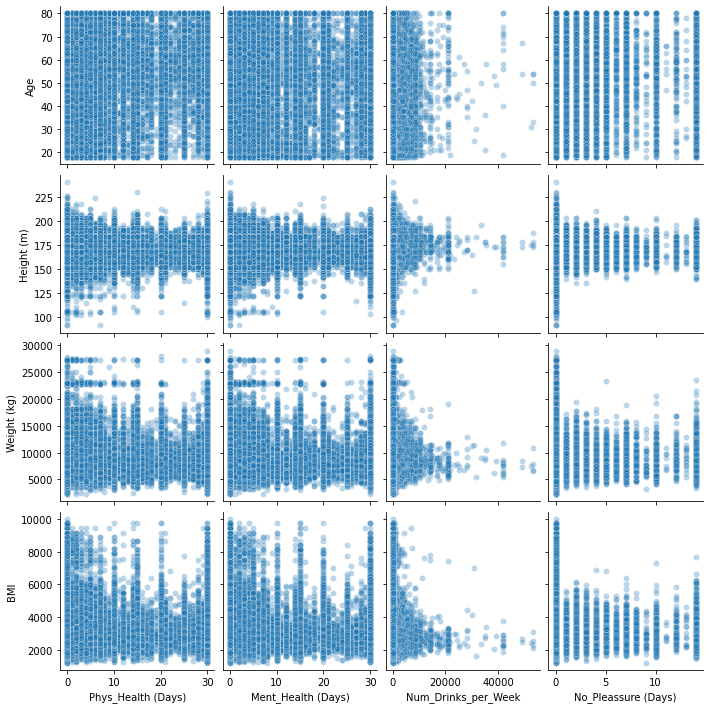

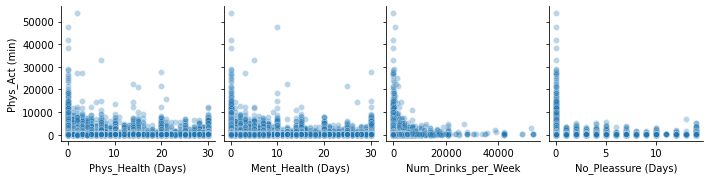

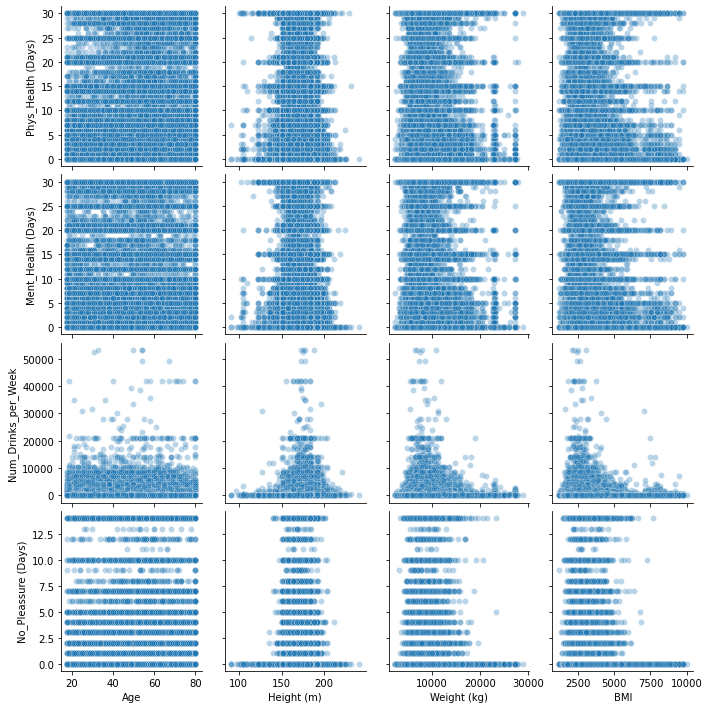

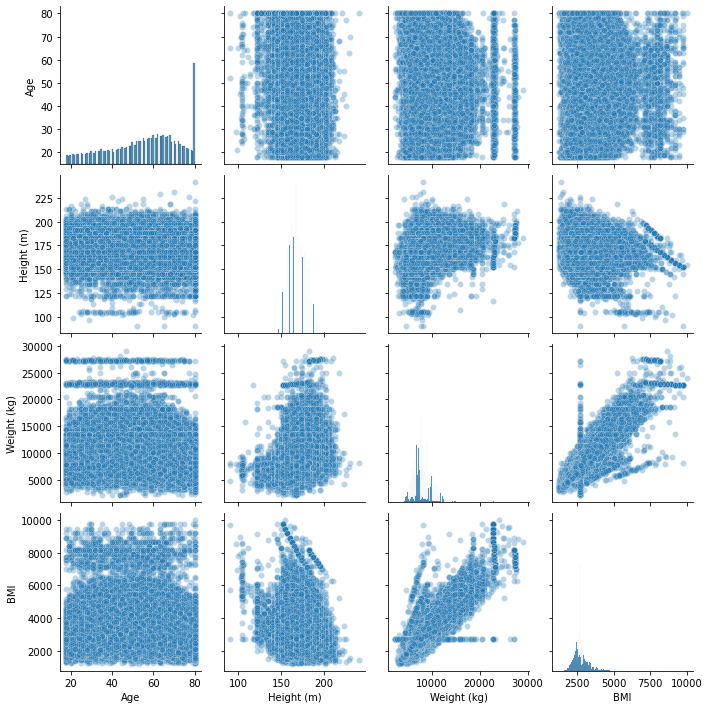

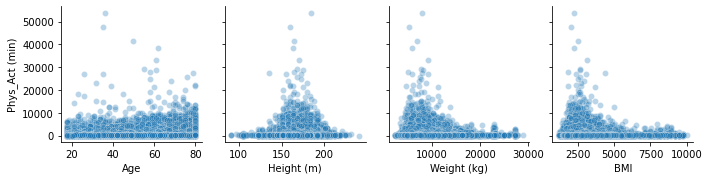

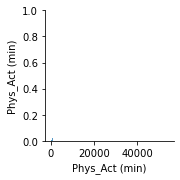

In [49]:
cols = df_non_cat_sub.columns
n_cols = df_non_cat_sub.shape[1]
chunksize = 4
blocks = n_cols // chunksize
rem = n_cols - chunksize * blocks

for i in range(0, blocks):
    for j in range(0, blocks):
        sns.pairplot(data=df_non_cat_sub, x_vars=cols[i * chunksize:(i + 1) * chunksize], \
                          y_vars=cols[j * chunksize:(j + 1) * chunksize], plot_kws={'alpha':0.3})
        plt.show()
    
    sns.pairplot(data=df_non_cat_sub, x_vars=cols[i * chunksize:(i + 1) * chunksize], \
                y_vars=cols[blocks * chunksize:], plot_kws={'alpha':0.3})
    plt.show()

sns.pairplot(data=df_non_cat_sub, x_vars=cols[blocks * chunksize:], \
                y_vars=cols[blocks * chunksize:], plot_kws={'alpha':0.3})
plt.show()

The only scatter plot where you can see a significant correlation is on the one for `BMI` vs `Weight (kg)`, but his is to be expected due to the definition of the BMI index

**Making the heatmap for the non-categorical features**

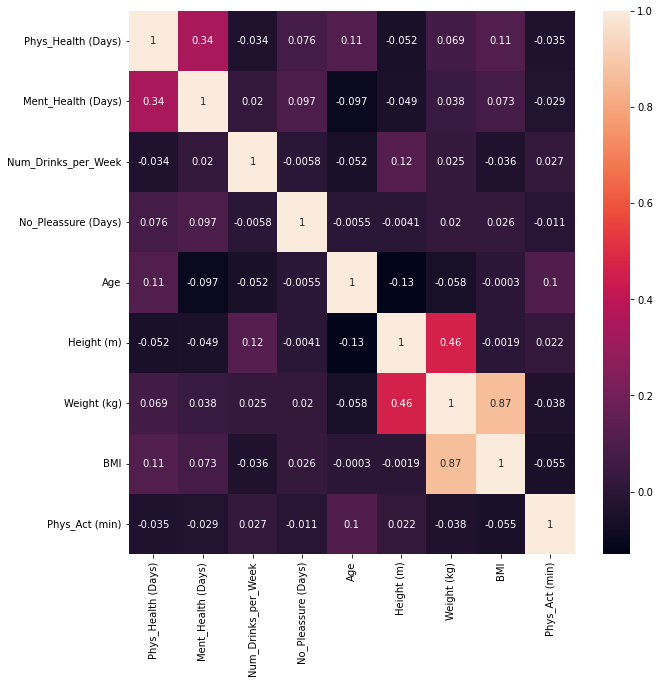

In [50]:
plt.figure(figsize=(10, 10))
sns.heatmap(df_non_cat_sub.corr(), annot=True)
plt.show()

The two highest correlations happen for the pair `BMI` vs `Weight (kg)` and `Weight (kg)` vs `Height (m)`. The first pair has a high correlation due to the definition of the BMI index. The second pair having a high correlation is intuitive. The next highest correlation occurs in the pair `Phys_Health (Days)` vs `Ment_Health (Days)`, but it is only very moderate.

## 4.6 Categorical Plots Based on Demographics
I now wish to examine if there are interesting trends within different demographics and how they compare among the different demographics. The demographics I will examine will be `Race`, `Age Group`, `Income Level`, and `Education`.

**Combining the categorical and non-categorical dataframes that were previously defined. I will also add the column with the sample weights, which will be used**

In [51]:
df_comb = pd.concat([df_cat_sub, df_non_cat_sub, df_cleaned['_LLCPWT']], axis=1)
df_comb = df_comb.rename(columns={'_LLCPWT':'Sample Weights'})
df_comb

,Good Health,Hypertension,High Cholesterol,Heart Disease,Binge Drinker,Asthma,Arthritis,Smoker,Overweight,Race,...,Phys_Health (Days),Ment_Health (Days),Num_Drinks_per_Week,No_Pleassure (Days),Age,Height (m),Weight (kg),BMI,Phys_Act (min),Sample Weights
0,No,Yes,Yes,No,No,Yes,Yes,No,Yes,White,...,15.0,18.0,0.0,0.0,63.0,178.0,12701.0,4018.0,275.0,341.384853
1,Yes,No,No,No,No,No,No,Yes,Yes,White,...,0.0,0.0,0.0,0.0,52.0,173.0,7484.0,2509.0,168.0,108.060903
2,No,No,Yes,Missing,Unknown,No,Yes,Unknown,No,White,...,15.0,0.0,0.0,0.0,71.0,180.0,7167.0,2204.0,275.0,255.264797
3,No,Yes,Yes,No,No,No,Yes,No,Yes,White,...,30.0,30.0,0.0,0.0,63.0,170.0,8165.0,2819.0,275.0,341.384853
4,No,No,No,No,No,No,Yes,No,No,White,...,20.0,0.0,0.0,0.0,61.0,163.0,6441.0,2437.0,275.0,258.682223
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441451,No,Yes,Yes,No,No,No,Yes,No,No,Hispanic,...,0.0,0.0,0.0,0.0,72.0,160.0,4717.0,1842.0,275.0,531.980410
441452,Yes,No,No,No,No,No,No,No,Yes,Hispanic,...,0.0,0.0,0.0,0.0,29.0,160.0,7257.0,2834.0,150.0,746.416599
441453,No,Yes,Yes,No,No,No,No,No,Yes,Hispanic,...,0.0,20.0,93.0,0.0,70.0,165.0,11204.0,4110.0,275.0,207.663634
441454,Yes,Yes,No,No,No,No,No,No,No,Hispanic,...,0.0,0.0,0.0,0.0,52.0,180.0,7530.0,2315.0,275.0,515.758894


In [52]:
df_comb.columns

Index(['Good Health', 'Hypertension', 'High Cholesterol', 'Heart Disease',
       'Binge Drinker', 'Asthma', 'Arthritis', 'Smoker', 'Overweight', 'Race',
       'Age Group', 'Education', 'Income Category', 'Phys_Health (Days)',
       'Ment_Health (Days)', 'Num_Drinks_per_Week', 'No_Pleassure (Days)',
       'Age', 'Height (m)', 'Weight (kg)', 'BMI', 'Phys_Act (min)',
       'Sample Weights'],
      dtype='object')

### 4.6.1 Normalized Countplots of Categorical Features by Demographics

**Defining function that creates dataframe with the proportion of each category of each feature within each demographic group**

In [53]:
def make_prop_df(dataframe, group, column, weights = None):
    '''This function created a dataframe whose rows are the demographic groups and the columns are the
       features of interest. Every cell contains the proportion of each category within the demographic 
       group. This function allows the option of calculating the proportions with or without the 
       sample weights.'''
    df_prop = pd.DataFrame()
    group = group
    col = column
    if weights != None:
        w = weights
        gb = dataframe.groupby(group)[[col, w]]
        for name, df_g in gb:
            w_sum = df_g[w].sum()
            s_fixed_counts = (df_g.groupby(col)[w].sum() / w_sum).sort_index().rename(name)
            s_transposed = pd.DataFrame(s_fixed_counts).transpose()
            df_prop = pd.concat([df_prop, s_transposed], axis=0)
    else:
        w = None
        gb = dataframe.groupby(group)[[col]]
        for name, df_g in gb:
            summ = df_g.shape[0]
            s_counts = (df_g.groupby(col)[col].count() / summ).sort_index().rename(name)
            s_transposed = pd.DataFrame(s_counts).transpose()
            df_prop = pd.concat([df_prop, s_transposed], axis=0)
    
    df_prop.index.name = group
    df_prop.columns.name = col
            
    return df_prop

**Examples of the use of the function defined in the previous cell, one without using the sample weights and one using them**

In [54]:
print(make_prop_df(df_comb, 'Race', 'Good Health'))
print('\n')
print(make_prop_df(df_comb, 'Race', 'Good Health', 'Sample Weights'))

Good Health       Yes        No   Unknown
Race                                     
White        0.831426  0.166244  0.002330
Black        0.737553  0.258312  0.004134
Other        0.814408  0.183201  0.002391
Multiracial  0.759686  0.236145  0.004169
Hispanic     0.709513  0.286325  0.004163
Unknown      0.769800  0.217830  0.012371


Good Health       Yes        No   Unknown
Race                                     
White        0.845457  0.152464  0.002079
Black        0.784217  0.211828  0.003955
Other        0.869445  0.128528  0.002027
Multiracial  0.786544  0.210281  0.003175
Hispanic     0.737601  0.257480  0.004919
Unknown      0.784718  0.203176  0.012106


**Generating the count plots, using the sample weights**

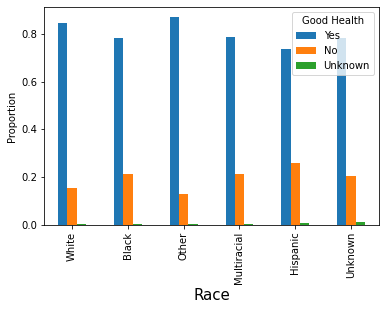

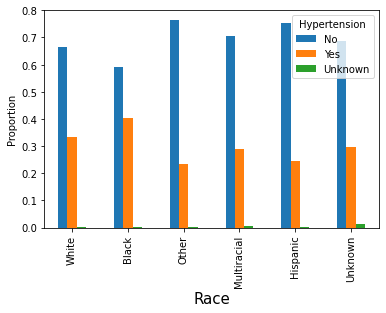

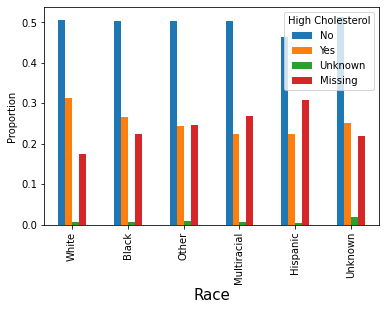

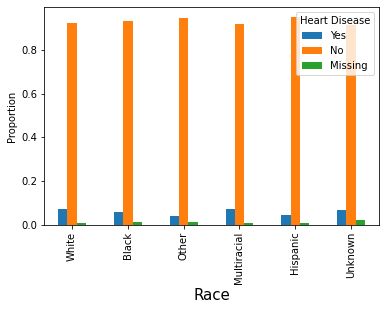

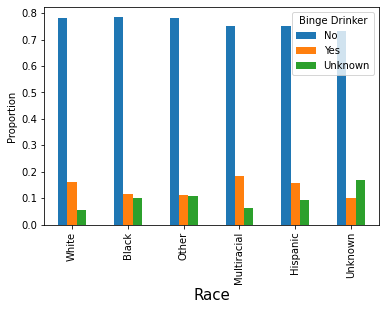

...

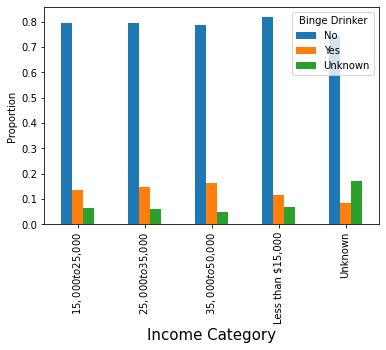

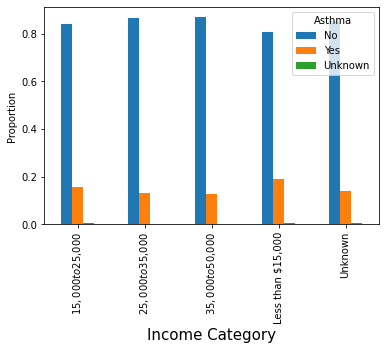

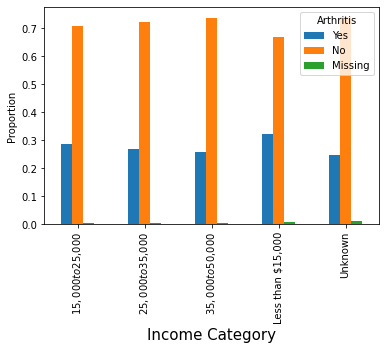

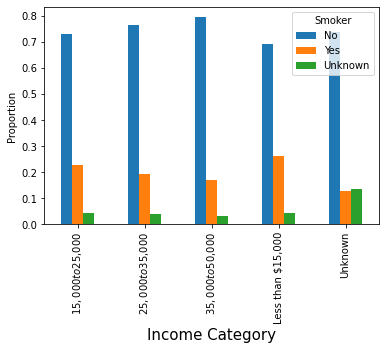

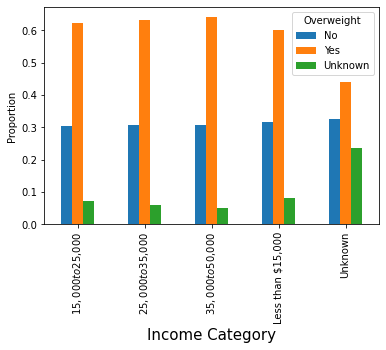

In [55]:
cols_demo = [trans_demo[x][0] for x in trans_demo.keys()]
cols_health = [trans_health[x][0] for x in trans_health.keys()]
for g in cols_demo:
    for c in cols_health:
        make_prop_df(df_comb, g, c, 'Sample Weights').plot.bar()
        plt.xlabel(g, fontsize=15)
        plt.ylabel('Proportion')
        plt.legend(title=c)
        plt.show()
        print()

It can be observed from the previous plots that for many of the health features, the proportion of individuals that have negative health outcomes decrease for groups with higher education and income level. It can also be observed that for many health features the proportion of individuals with negative health outcomes increases with age.

### 4.6.2 Boxplot for Non-Categorical Features by Demographics

**Plotting the boxplots of different non-categorical health features for different demographic groups**

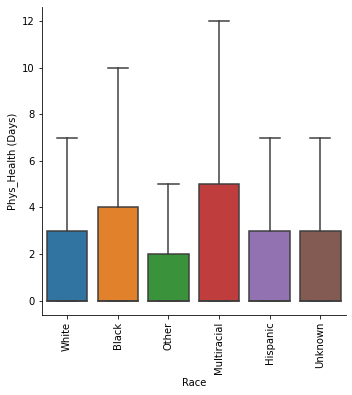

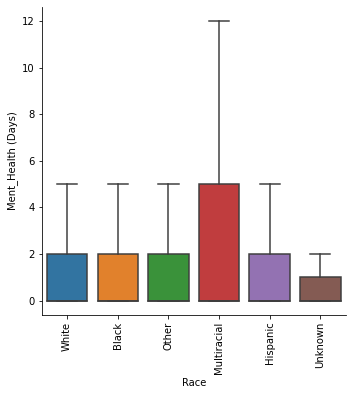

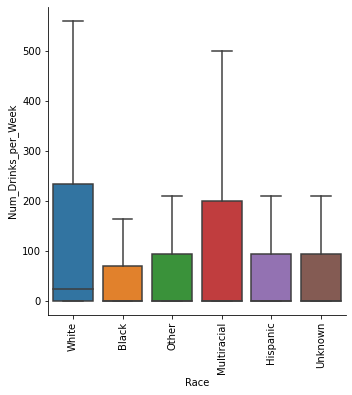

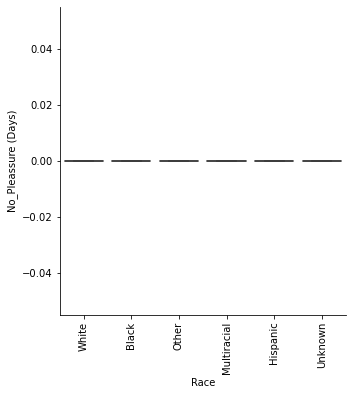

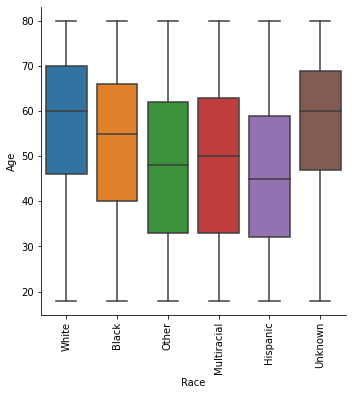

...

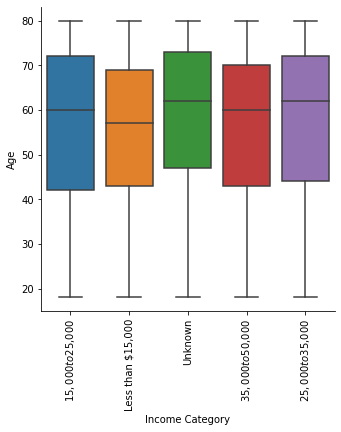

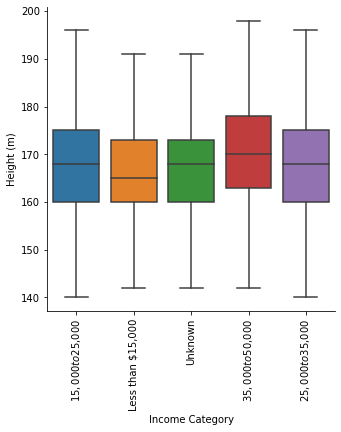

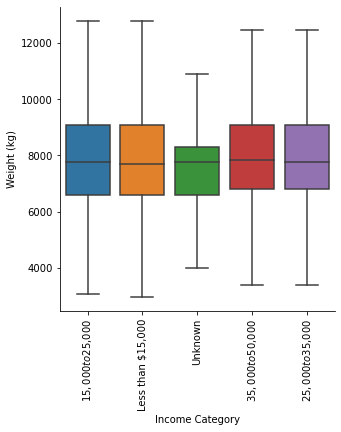

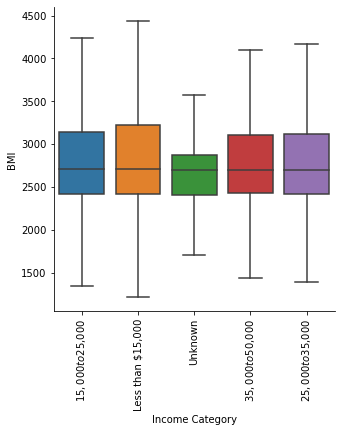

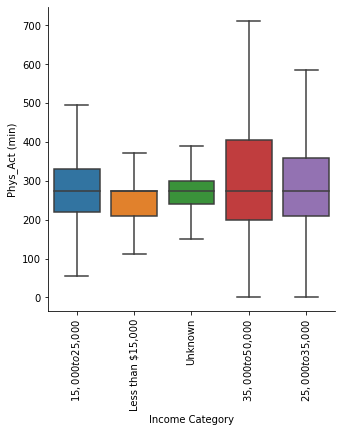

In [56]:
for g in [x[0] for x in trans_demo.values()]:
    for c in trans_non_cat_cols:
            sns.catplot(data=df_comb, x=g, y=c, kind='box', showfliers=False)
            plt.xticks(rotation=90)
            plt.show()

One observation we can make from the previous plots is that for some of the health features the distributions are broader for lower income levels and lower education levels. Some of them also become broader as age increases.

Overall, these boxplots in conjunction with the previous count plots seem to suggest that, on average, individuals with lower education levels, lower income levels, and higher age tend to be less healthy with respect to some of the health features.

# 5 Final Remarks
This was the exploratory data analysis part of the project. The next part of this Project consists of the Pre-Processing and Training steps. I will build a baseline model using Logistic Regression with the feature `Heart Disease` as my target and measure its performance. I will be able to use the coefficients of said model to analyze the impact of the features. 